In [1]:
from dataset import load_dataset
import matplotlib.pyplot as plt
import torch
import numpy as np
from sklearn.model_selection import train_test_split
from metrics import statistics, preproc

In [2]:
from ray import air, tune
from ray.air import session

In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [4]:
import os
os.environ['CUDA_LAUNCH_BLOCKING']="0"

In [5]:
from torch import nn, Tensor
from torch.autograd import Variable
from torch.nn import TransformerEncoderLayer, TransformerEncoder
import math

class PositionalEncoding(nn.Module):
    "Implement the PE function."
    def __init__(self, d_model, dropout, max_len=5000):   
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)
        
        # Compute the positional encodings once in log space.
        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2) * -(math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0)
        self.register_buffer('pe', pe)
        
    def forward(self, x):
        # Add position encodings to embeddings
        # x: embedding vects, [B x L x d_model]
        x = x + Variable(self.pe[:, :x.size(1)], requires_grad=False)
        return self.dropout(x)

class Transformer(nn.Module):
    def __init__(self, d_model, h, d_ff, num_layers, n_channels, n_classes, dropout):
        super(Transformer, self).__init__()
        self.d_model = d_model
        self.h = h
        self.d_ff = d_ff
        self.num_layers = num_layers
        self.dropout = dropout
        self.n_channels = n_channels
        self.pe = PositionalEncoding(d_model, dropout=0.1)
        encode_layer = nn.TransformerEncoderLayer(
            d_model=self.d_model, 
            nhead=self.h, 
            dim_feedforward=self.d_ff, 
            dropout=self.dropout)
        self.transformer_encoder = nn.TransformerEncoder(encode_layer, self.num_layers)
        self.encoder = nn.Linear(n_channels, d_model)
        self.decoder = nn.Linear(d_model, n_classes)
        
    def forward(self, x):
        out = self.encoder(x) * math.sqrt(self.d_model)
        out = self.pe(out)
        out = out.permute(1, 0, 2)
        out = self.transformer_encoder(out)
        out = self.decoder(out)
        out = out.permute((1, 2, 0))
        return out

In [6]:
""" Parts of the U-Net model """

import torch
import torch.nn as nn
import torch.nn.functional as F


class DoubleConv(nn.Module):
    """(convolution => [BN] => ReLU) * 2"""

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv1d(in_channels, out_channels, kernel_size=9, padding=4, bias=False),
            nn.BatchNorm1d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv1d(out_channels, out_channels, kernel_size=9, padding=4, bias=False),
            nn.BatchNorm1d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)


class Down(nn.Module):
    """Downscaling with maxpool then double conv"""

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool1d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.maxpool_conv(x)


class Up(nn.Module):
    """Upscaling then double conv"""

    def __init__(self, in_channels, out_channels):
        super().__init__()

        self.up = nn.ConvTranspose1d(in_channels, in_channels // 2, kernel_size=8, stride=2, padding=3)
        self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        # input is CHW
        diffY = x2.size()[1] - x1.size()[1]
        diffX = x2.size()[2] - x1.size()[2]

        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])

        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)


class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv1d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        return self.conv(x)


In [7]:
""" Full assembly of the parts to form the complete network """

class UNet(nn.Module):
    def __init__(self, n_channels, n_classes):
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes

        self.inc = DoubleConv(n_channels, 4)
        self.down1 = Down(4, 8)
        self.down2 = Down(8, 16)
        self.down3 = Down(16, 32)
        self.down4 = Down(32, 64)
        self.up1 = Up(64, 32)
        self.up2 = Up(32, 16)
        self.up3 = Up(16, 8)
        self.up4 = Up(8, 4)
        self.outc = OutConv(4, n_classes)

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        logits = self.outc(x)
        return logits

In [8]:
""" Full assembly of the parts to form the complete network """

class UNetV2(nn.Module):
    def __init__(self, n_channels, n_classes, n_layers, start_scale):
        super(UNetV2, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.n_layers = n_layers

        self.inc = DoubleConv(n_channels, start_scale)

        if (n_layers > 1):
            self.encoder = nn.ModuleList(
                [Down(start_scale * (2 ** (i - 1)), start_scale * (2 ** i)) for i in range(1, n_layers)])
            self.decoder = nn.ModuleList(
                [Up(start_scale * (2 ** i), start_scale * (2 ** (i - 1))) for i in reversed(range(1, n_layers))])

        self.outc = OutConv(start_scale, n_classes)

    def forward(self, x):
        x_list = [self.inc(x)]
        if (self.n_layers > 1):
            for down in self.encoder:
                x_list.append(down(x_list[-1]))
        if (self.n_layers > 1):
            for up in self.decoder:
                x_list.append(up(x_list.pop(), x_list.pop()))

        logits = self.outc(x_list[0])
        return logits

In [9]:
class UNetInT(nn.Module):
    def __init__(self, n_channels, n_classes, unet_n_layers, start_scale, d_model, h, d_ff, num_layers, dropout):
        """
        :param n_channels: количество входных каналов
        :param n_classes: количество выходных каналов (классов)
        :param start_scale: с какого количества каналов начинает работать Unet
        :param d_model: количество ожидаемых features на входе трансформера
        :param h: количество heads в multiheadattention
        :param d_ff: количесвто нейроннов в полносвязной сети трансформера
        :param num_layers: количество слоёв в трансформере
        :param dropout:
        """
        super(UNetInT, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.unet_n_layers = unet_n_layers
        
        self.transformer = Transformer(d_model, h, d_ff, num_layers, n_channels, n_channels, dropout=dropout)
        
        self.inc = DoubleConv(n_channels, start_scale)
        
        if(unet_n_layers > 1):
            self.encoder = nn.ModuleList([Down(start_scale * (2 ** (i - 1)), start_scale * (2 ** i)) for i in range(1, unet_n_layers)])
            self.decoder = nn.ModuleList([Up(start_scale * (2 ** i), start_scale * (2 ** (i - 1))) for i in reversed(range(1, unet_n_layers))])

        self.outc = OutConv(start_scale, n_classes)

    def forward(self, x):
        x = self.transformer(x.permute(0, 2, 1))
        x_list = [self.inc(x)]
        if self.unet_n_layers > 1:
            for down in self.encoder:
                x_list.append(down(x_list[-1]))
        
        if self.unet_n_layers > 1:
            for up in self.decoder:
                x_list.append(up(x_list.pop(), x_list.pop()))

        logits = self.outc(x_list[0])
        return logits

In [10]:
class UNetMiddleT(nn.Module):
    def __init__(self, n_channels, n_classes, unet_n_layers, start_scale, d_model, h, d_ff, num_layers, dropout):
        """
        :param n_channels: количество входных каналов
        :param n_classes: количество выходных каналов (классов)
        :param start_scale: с какого количества каналов начинает работать Unet
        :param d_model: количество ожидаемых features на входе трансформера
        :param h: количество heads в multiheadattention
        :param d_ff: количесвто нейроннов в полносвязной сети трансформера
        :param num_layers: количество слоёв в трансформере
        :param dropout:
        """
        super(UNetMiddleT, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.unet_n_layers = unet_n_layers

        self.transformer = Transformer(d_model, h, d_ff, num_layers, start_scale * (2 ** (unet_n_layers - 1)),
                                       start_scale * (2 ** (unet_n_layers - 1)), dropout=dropout)

        self.inc = DoubleConv(n_channels, start_scale)

        if (unet_n_layers > 1):
            self.encoder = nn.ModuleList(
                [Down(start_scale * (2 ** (i - 1)), start_scale * (2 ** i)) for i in range(1, unet_n_layers)])
            self.decoder = nn.ModuleList(
                [Up(start_scale * (2 ** i), start_scale * (2 ** (i - 1))) for i in reversed(range(1, unet_n_layers))])

        self.outc = OutConv(start_scale, n_classes)

    def forward(self, x):
        x_list = [self.inc(x)]
        
        if self.unet_n_layers > 1:
            for down in self.encoder:
                x_list.append(down(x_list[-1]))
                
        x_list.append(self.transformer(x_list.pop().permute(0, 2, 1)))
        
        if self.unet_n_layers > 1:
            for up in self.decoder:
                x_list.append(up(x_list.pop(), x_list.pop()))

        logits = self.outc(x_list[0])
        return logits

In [11]:
class UNetOutT(nn.Module):
    def __init__(self, n_channels, n_classes, unet_n_layers, start_scale, d_model, h, d_ff, num_layers, dropout):
        """
        :param n_channels: количество входных каналов
        :param n_classes: количество выходных каналов (классов)
        :param start_scale: с какого количества каналов начинает работать Unet
        :param d_model: количество ожидаемых features на входе трансформера
        :param h: количество heads в multiheadattention
        :param d_ff: количесвто нейроннов в полносвязной сети трансформера
        :param num_layers: количество слоёв в трансформере
        :param dropout:
        """
        super(UNetOutT, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.unet_n_layers = unet_n_layers

        self.transformer = Transformer(d_model, h, d_ff, num_layers, n_classes, n_classes, dropout=dropout)

        self.inc = DoubleConv(n_channels, start_scale)

        if (unet_n_layers > 1):
            self.encoder = nn.ModuleList(
                [Down(start_scale * (2 ** (i - 1)), start_scale * (2 ** i)) for i in range(1, unet_n_layers)])
            self.decoder = nn.ModuleList(
                [Up(start_scale * (2 ** i), start_scale * (2 ** (i - 1))) for i in reversed(range(1, unet_n_layers))])

        self.outc = OutConv(start_scale, n_classes)

    def forward(self, x):
        x_list = [self.inc(x)]
        if self.unet_n_layers > 1:
            for down in self.encoder:
                x_list.append(down(x_list[-1]))
                
        if self.unet_n_layers > 1:
            for up in self.decoder:
                x_list.append(up(x_list.pop(), x_list.pop()))
        
        x_list.append(self.outc(x_list.pop()))
        x_list.append(self.transformer(x_list.pop().permute(0, 2, 1)))
        logits = x_list[-1]
        return logits

In [12]:
def draw_prediction_and_reality(ecg_signal, prediction, right_answer, plot_name):
    """
    :param ecg_signal: сигнал некотего отведения
    :param prediction: предсказаные бинарные маски для этого отведения
    :param right_answer: правильная маска этого отведения (тоже три штуки)
    :param plot_name: имя картинки, куда хотим отрисовать это
    :return:
    """
    figname = plot_name + "_.png"
    print(ecg_signal.shape)
    print(prediction.shape)
    prediction = prediction.squeeze()
    #ecg_signal = ecg_signal.squeeze().cpu().detach().numpy()
    ecg_signal = ecg_signal.cpu().detach().numpy()
    right_answer = right_answer.squeeze().cpu().detach().numpy()
    prediction = prediction.cpu().detach().numpy()
    #prediction = mm.fit_transform(prediction)

    print(right_answer.shape)
    f, (ax1, ax2) = plt.subplots(2, 1, sharey=False, sharex=True, figsize=(20, 5))
    x = range(0, len(ecg_signal))
    #ecg_signal = ecg_signal.to('cpu')
    #right_answer = right_answer.to('cpu')
    #prediction = prediction.to('cpu')
    ax1.plot(ecg_signal[:,0], color='black')

    ax1.fill_between(x, 0, 100, where=right_answer[:, 0]>0.5, alpha=0.5, color='red')
    ax1.fill_between(x, 0, 100, where=right_answer[:, 1]>0.5, alpha=0.5, color='green')
    ax1.fill_between(x, 0, 100, where=right_answer[:, 2]>0.5, alpha=0.5, color='blue')

    ax1.fill_between(x, 120, 220, where=prediction[:, 0] > 0.5, alpha=0.8, color='red')
    ax1.fill_between(x, 120, 220, where=prediction[:, 1] > 0.5, alpha=0.8, color='green')
    ax1.fill_between(x, 120, 220, where=prediction[:, 2] > 0.5, alpha=0.8, color='blue')

    ax2.plot(prediction[:,0], 'r-')
    ax2.plot(prediction[:,1], 'g-')
    ax2.plot(prediction[:,2], 'b-')

    plt.legend(loc=2)
    plt.show()

In [13]:
def draw_prediction_and_reality_2(ecg_signal, prediction, right_answer, plot_name):
    """
    :param ecg_signal: сигнал некотего отведения
    :param prediction: предсказаные бинарные маски для этого отведения
    :param right_answer: правильная маска этого отведения (тоже три штуки)
    :param plot_name: имя картинки, куда хотим отрисовать это
    :return:
    """
    figname = plot_name + "_.png"
    print(ecg_signal.shape)
    print(prediction.shape)
    prediction = prediction.squeeze()
    #ecg_signal = ecg_signal.squeeze().cpu().detach().numpy()
    ecg_signal = ecg_signal.cpu().detach().numpy()
    right_answer = right_answer.squeeze().cpu().detach().numpy()
    prediction = prediction.cpu().detach().numpy()

    print(right_answer.shape)
    f, ax1 = plt.subplots(1, 1, sharey=False, sharex=True, figsize=(15, 5))
    x = range(0, len(ecg_signal))
    #ecg_signal = ecg_signal.to('cpu')
    #right_answer = right_answer.to('cpu')
    #prediction = prediction.to('cpu')
    ax1.plot(ecg_signal[:,0], color='black')

    ax1.fill_between(x, 0, 100, where=right_answer[:, 0]>0.5, alpha=0.5, color='red', label='P волна')
    ax1.fill_between(x, 0, 100, where=right_answer[:, 1]>0.5, alpha=0.5, color='green', label='QRS комплекс')
    ax1.fill_between(x, 0, 100, where=right_answer[:, 2]>0.5, alpha=0.5, color='blue', label='T волна')

    ax1.fill_between(x, 120, 220, where=prediction[:, 0] > 0.5, alpha=0.8, color='red')
    ax1.fill_between(x, 120, 220, where=prediction[:, 1] > 0.5, alpha=0.8, color='green')
    ax1.fill_between(x, 120, 220, where=prediction[:, 2] > 0.5, alpha=0.8, color='blue')
    
    ax1.set_xlabel('Время (мс)')
    ax1.set_ylabel('Амплитуда (мВ)')

    plt.legend(loc=2)
    plt.savefig(plot_name + '.png')
    #plt.show()

In [14]:
data = load_dataset()

you selected FIXED BASELINE WANDERING


In [15]:
X_train, X_test, Y_train, Y_test, Z_train, Z_test = train_test_split(data['x'], data['y'], data['text'], test_size=0.33, random_state=42)

In [16]:
class LUBDDataset(torch.utils.data.Dataset):
    def __init__(self, signals, masks, names, win_len, num_leads_signal=12):
        self._signals = torch.FloatTensor(signals)
        self._masks = torch.LongTensor(masks)
        self._names = names
        self._win_len = win_len
        self._num_leads_signal = num_leads_signal
        self.OFFSET = 700
    def __len__(self):
        return len(self._signals)

    def __getitem__(self, i):
        all_ecg_len = self._signals.shape[1]
        starting_position = np.random.randint(self.OFFSET, all_ecg_len - win_len - self.OFFSET)
        ending_position = starting_position + win_len
        return self._signals[i, starting_position:ending_position, 0:num_leads_signal].to(device), self._masks[i, starting_position:ending_position, :].to(device), self._names[i]

In [17]:
def get_loader(signals, masks, names, win_len, batch_size, num_leads_signal=12):
    dataset = LUBDDataset(signals, masks, names, win_len, num_leads_signal)
    from torch.utils.data import DataLoader
    return DataLoader(dataset, batch_size=batch_size)

In [18]:
win_len = 3072
batch_size = 4
num_leads_signal = 12

In [19]:
train_loader = get_loader(X_train, Y_train, Z_train, win_len, batch_size, num_leads_signal)
val_loader = get_loader(X_test, Y_test, Z_test, win_len, batch_size, num_leads_signal)

In [20]:
import torch.nn.functional as F

def get_softmax(logits):
    softmax = nn.Softmax(dim=2)
    res = logits.permute((0, 2, 1))
    res = softmax(res)
    return res.permute((0, 2, 1))

def get_ReLU(logits):
    relu = nn.ReLU()
    return relu(logits)

def mock_func_active(logits):
    return logits

def get_loss(model, X_batch, y_batch, func_active):
    X_batch = X_batch.permute((0, 2, 1))
    logits = model(X_batch)  # shape: (8, 4, 3072)
    logits = func_active(logits)
    #logits = logits[:, :, 1000:-1000]
    y_batch = torch.argmax(y_batch, dim=2)
    #y_batch = y_batch[:, 1000:-1000]
    #return F.cross_entropy(logits, y_batch).mean()
    return F.cross_entropy(logits, y_batch, torch.tensor([0.1, 0.7, 0.1, 0.1]).to(device)).mean()
    #return F.cross_entropy(logits, y_batch, torch.tensor([0.1,0.25,0.2,0.45]).to(device)).mean()
    #return F.cross_entropy(logits, y_batch, torch.tensor([0.1, 0.4, 0.3, 0.2]).to(device)).mean()

def get_bce_loss(model, X_batch, y_batch, func_active):
    X_batch = X_batch.permute((0, 2, 1))
    logits = model(X_batch)  # shape: (8, 4, 3072)
    logits = func_active(logits).permute((0, 2, 1))
    #logits = logits[:, :, 1000:-1000]
    #y_batch = torch.argmax(y_batch, dim=2)
    #y_batch = y_batch[:, 1000:-1000]
    return F.binary_cross_entropy_with_logits(logits.float(), y_batch.float()).mean()

In [21]:
from IPython.display import clear_output
class Drawer():
    def __init__(self):
        self._train = []
        self._val = []

    def add(self, train_loss, val_iou):
        self._train.append(train_loss)
        self._val.append(val_iou)

    def plot(self):
        epochs = range(1, 1 + len(self._train))

        fig, ax = plt.subplots(1,1, figsize=(10, 8))
        ax.set_title('Train and test loss')
        ax.set_xlabel('Epoch')
        ax.set_ylabel('Loss')
        ax.plot(epochs, self._train, 'b--', label = "Train loss")
        ax.plot(epochs, self._val, c='red', label = "Test loss")
        ax.legend()
        #plt.savefig('loss.png')
        plt.show()
    def save_plot(self):
        epochs = range(1, 1 + len(self._train))

        fig, ax = plt.subplots(1,1, figsize=(10, 8))
        ax.set_title('Train and test loss')
        ax.set_xlabel('Epoch')
        ax.set_ylabel('Loss')
        ax.plot(epochs, self._train, 'b--', label = "Train loss")
        ax.plot(epochs, self._val, c='red', label = "Test loss")
        ax.legend()
        plt.savefig('loss.png')

In [22]:
min_losses = []

In [23]:
def fit(model, train_loader, val_loader, optimizer, scheduler, loss_function, func_active, num_epochs=None):
    import time
    train_losses = []
    val_losses = []
    drawer = Drawer()
    min_loss = 1e6
    min_loss_index = 0
    epoch = 0

    while num_epochs is None or epoch < num_epochs:
        start_time = time.time()
        model.train()
        for X_batch, y_batch, _ in train_loader:
            loss = loss_function(model, X_batch.to(device), y_batch.to(device), func_active)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            train_losses.append(loss.cpu().data.numpy())

        model.eval()
        for X_batch, y_batch, _ in val_loader:
            with torch.no_grad():
                loss = loss_function(model, X_batch.to(device), y_batch.to(device), func_active)
                val_losses.append(loss.cpu().data.numpy())

        train_loss = np.mean(train_losses[-len(train_loader):])
        val_loss = np.mean(val_losses[-len(val_loader):])
        #print(len(train_loader), len(val_loader))
        drawer.add(train_loss, val_loss)
        clear_output(True)
        drawer.plot()
        print("Epoch {} took {:.3f}s".format(epoch + 1, time.time() - start_time))
        print("training loss: \t{:.6f}".format(train_loss))
        print("validation loss: \t{:.6f}".format(val_loss))

        if val_loss < min_loss - 1e-5:
            min_loss = val_loss
            min_loss_index = epoch
        elif epoch - min_loss_index >= 10:
            break

        epoch += 1
        scheduler.step()

    min_losses.append(min_loss)
    drawer.save_plot()

In [24]:
#model = UNetV2(12, 4, 3, 1)
#model = model.to(device)

In [25]:
#model = Transformer(d_model=512, h=8, d_ff=512, num_layers=4, num_classes=4, n_channels=12, dropout=0.2)
#model = UNetInT(12, 4, 5, 4, 64, 2, 256, 2, 0.1)
#model = UNetInT(12, 4, 5, 16, 2048, 8, 8192, 8, 0.1)
#model = UNetInT(12, 4, 5, 16, 512, 4, 2048, 6, 0.1)
#model = model.to(device)

In [26]:
params = {
  "d_ff": 2048,
  "d_model": 512,
  "dropout": 0.5,
  "h": 1,
  "num_layers": 1,
  "start_scale": 16,
  "unet_n_layers": 5
}

In [27]:
params = {
  "d_ff": 256,
  "d_model": 16,
  "dropout": 0.3,
  "h": 1,
  "num_layers": 2,
  "start_scale": 8,
  "unet_n_layers": 5
}

In [28]:
# model = UNetOutT(12, 4, params['unet_n_layers'], params['start_scale'],
#                 params['d_model'], params['h'], params['d_ff'],
#                 params['num_layers'], params['dropout'])
# model = model.to(device)

In [29]:
# model = UNetOutT(12, 4, params['unet_n_layers'], params['start_scale'],
#                     params['d_model'], params['h'], params['d_ff'],
#                     params['num_layers'], params['dropout'])
# model = model.to(device)

In [30]:
# model = UNetMiddleT(n_channels=12, n_classes=4, unet_n_layers = 5, start_scale = 8, d_model = 128, h = 2, d_ff = 128, num_layers = 6, dropout=0.1)
# model = model.to(device)

In [31]:
# model = UNetInT(n_channels=12, n_classes=4, unet_n_layers=4, start_scale=16, d_model=16, h=4, d_ff=512, num_layers=1, dropout=0.2)
# model = model.to(device)

In [32]:
# unet = UNetV2(n_channels=12, n_classes=4, n_layers=4, start_scale=16)
# unet = unet.to(device)

In [33]:
best_model = UNetMiddleT(n_channels=12, n_classes=4, unet_n_layers = 5, start_scale = 8, d_model = 128, h = 2, d_ff = 128, num_layers = 6, dropout=0.1)
best_model = best_model.to(device)

In [34]:
# model = UNetMiddleT(n_channels=12, n_classes=4, unet_n_layers = 5, start_scale = 8, d_model = 128, h = 2, d_ff = 128, num_layers = 6, dropout=0.1)
# model = model.to(device)

In [35]:
# unet = UNetV2(n_channels=12, n_classes=4, n_layers=5, start_scale=8)
# unet = unet.to(device)

In [36]:
model = UNetOutT(n_channels=12, n_classes=4, unet_n_layers=5, start_scale=16, d_model=16, h=2, d_ff=64, num_layers=1, dropout=0.3)
model = model.to(device)

In [64]:
# model = UNetOutT(n_channels=12, n_classes=4, unet_n_layers=2, start_scale=8, d_model=16, h=1, d_ff=128, num_layers=3, dropout=0.3)
# model = model.to(device)

In [41]:
# model = UNetOutT(n_channels=12, n_classes=4, unet_n_layers=2, start_scale=16, d_model=256, h=4, d_ff=1024, num_layers=2, dropout=0.3)
# model = model.to(device)

In [37]:
unet = UNetV2(n_channels=12, n_classes=4, n_layers=5, start_scale=16)
unet = unet.to(device)

In [68]:
# unet = UNetV2(n_channels=12, n_classes=4, n_layers=2, start_scale=8)
# unet = unet.to(device)

In [39]:
# unet = UNetV2(n_channels=12, n_classes=4, n_layers=2, start_scale=16)
# unet = unet.to(device)

In [96]:
device

device(type='cuda')

In [97]:
print(sum(p.numel() for p in model.parameters()))

2121432


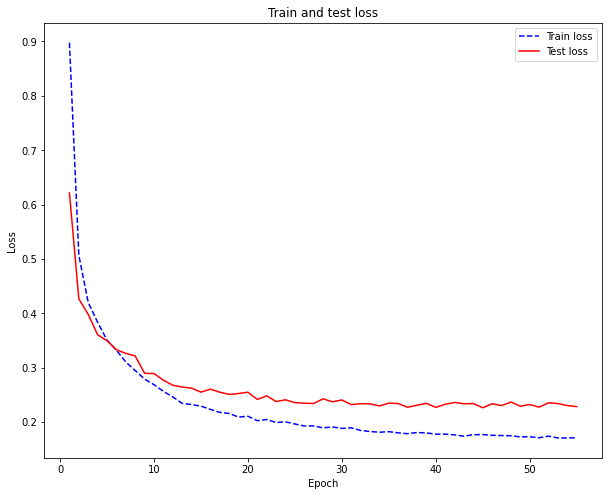

Epoch 55 took 3.808s
training loss: 	0.171206
validation loss: 	0.228408


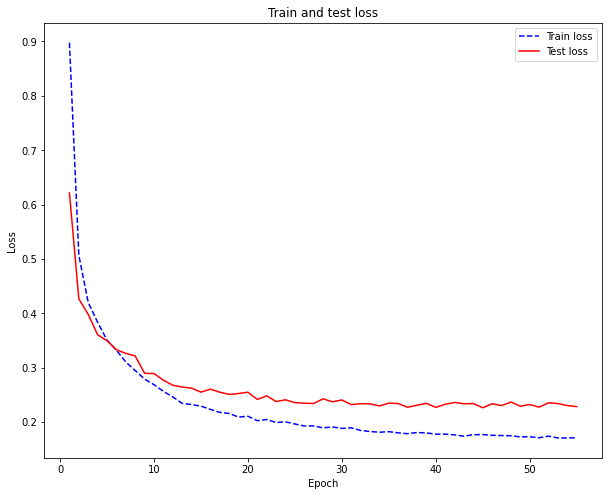

In [65]:
#model = TransformerModel(d_model=512, nhead=8, d_hid=512, nlayers=4, num_classes=4, n_channels=12, dropout=0.2)
optimizer = torch.optim.AdamW(model.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size= 10, gamma=0.5)
print(sum(p.numel() for p in model.parameters()))
#model = model.to(device)
num_epochs = 80
fit(model, train_loader, val_loader, optimizer, scheduler, get_loss, mock_func_active, num_epochs)

In [64]:
min_losses

[0.16614267]

d_model: количество ожидаемых features на входах энкодера/декодера

nhead: количество heads in the multiheadattention models

d_hid: the dimension of the feedforward network model

nlayers: the number of sub-encoder-layers in the encoder

In [92]:
model.eval()
with torch.no_grad():
    pred_test = model(torch.FloatTensor(X_test[:,1000:4072,:]).to(device).permute((0, 2, 1))).permute((0, 2, 1))
    #pred_test = model(torch.FloatTensor(X_test[:,:,:]).to(device)).permute((0, 2, 1))
    #pred_test = get_softmax(pred_test)
    #pred_test = pred_test.permute((0, 2, 1))
    #pred_test = to_one_hot_encode(pred_test)
    pred_test = F.one_hot(torch.argmax(pred_test, dim=2))
    pred_test = pred_test.cpu().detach().numpy()
print(statistics(Y_test[:, 1000:4072, :], pred_test[:, :, :]).round(4))

          start_p     end_p  start_qrs   end_qrs   start_t     end_t
Se         0.9264    0.9430     0.9931    0.9932    0.9954    0.9842
PPV        0.9555    0.9479     0.9040    0.9177    0.9198    0.9177
m          3.6822   -1.8516   -11.2841   10.5747   -7.1743    0.6529
sigma^2  543.1976  128.8461   588.3927  333.7846  912.6210  884.4473


In [66]:
model.eval()
with torch.no_grad():
    pred_test = model(torch.FloatTensor(X_test[:,1000:4072,:]).to(device).permute((0, 2, 1))).permute((0, 2, 1))
    #pred_test = model(torch.FloatTensor(X_test[:,:,:]).to(device)).permute((0, 2, 1))
    #pred_test = get_softmax(pred_test)
    #pred_test = pred_test.permute((0, 2, 1))
    #pred_test = to_one_hot_encode(pred_test)
    pred_test = F.one_hot(torch.argmax(pred_test, dim=2))
    pred_test = pred_test.cpu().detach().numpy()
print(statistics(Y_test[:, 1000:4072, :], pred_test[:, :, :]).round(4))

          start_p     end_p  start_qrs   end_qrs    start_t     end_t
Se         0.9112    0.9223     0.9908    0.9932     0.9498    0.9525
PPV        0.7327    0.7265     0.9643    0.9624     0.7550    0.7668
m          5.0306   -8.7809    -7.9907    8.7218     2.0769   -5.8385
sigma^2  367.4615  659.3565   103.0184  204.0123  1413.3979  850.9573


In [151]:
statistics(Y_test[:, 1000:4072, :], pred_test[:, :, :]).round(4).to_csv('test.csv')

In [283]:
print(statistics(Y_test[:, 1000:4000, :], pred_test[:, 1000:4000, :]).round(4))

           start_p      end_p  start_qrs    end_qrs    start_t      end_t
Se          0.3211     0.3227     0.3208     0.3364     0.3264     0.3233
PPV         0.4621     0.4583     0.4708     0.4949     0.4982     0.4811
m         -25.3115   -24.7273   -17.5474   -11.0759   -18.1560   -23.9286
sigma^2  5265.3620  5316.2314  5456.6419  5973.9598  5218.5005  4556.5378


In [152]:
#torch.save(model.state_dict(), r'out_t')
#model.load_state_dict(torch.load('123', map_location=device))
#model.load_state_dict(torch.load('ctt_unet_011_up'))

In [36]:
# model.load_state_dict(torch.load(r'C:\Users\game-\Desktop\Учёба\Python\PyThorch\Transformer\UNet_In_T\!!UNet_4_16_16_4_512_1_0.2\save.pt'))

<All keys matched successfully>

In [38]:
model.load_state_dict(torch.load(r'C:\Users\game-\Desktop\Учёба\Python\PyThorch\Transformer\UNet_Out_T\UNet_5_16\save.pt'))

<All keys matched successfully>

In [69]:
# model.load_state_dict(torch.load(r'C:\Users\game-\Desktop\Учёба\Python\PyThorch\Transformer\UNet_Out_T\UNet_2_8_16_1_128_3_0.3\save.pt'))

<All keys matched successfully>

In [52]:
# model.load_state_dict(torch.load(r'C:\Users\game-\Desktop\Учёба\Python\PyThorch\Transformer\UNet_Out_T\UNet_2_16_256_4_1024_2_0.3\save.pt'))

In [37]:
# unet.load_state_dict(torch.load(r'C:\Users\game-\Desktop\Учёба\Python\PyThorch\Transformer\UNet_models\UNet_4_16\checkpoint.pt'))

<All keys matched successfully>

In [54]:
# unet.load_state_dict(torch.load(r'C:\Users\game-\Desktop\Учёба\Python\PyThorch\Transformer\UNet_models\UNet_5_8\checkpoint.pt'))

<All keys matched successfully>

In [39]:
unet.load_state_dict(torch.load(r'C:\Users\game-\Desktop\Учёба\Python\PyThorch\Transformer\UNet_models\UNet_5_16\checkpoint.pt'))

<All keys matched successfully>

In [69]:
# unet.load_state_dict(torch.load(r'C:\Users\game-\Desktop\Учёба\Python\PyThorch\Transformer\UNet_models\UNet_2_8\checkpoint.pt'))

<All keys matched successfully>

In [45]:
# unet.load_state_dict(torch.load(r'C:\Users\game-\Desktop\Учёба\Python\PyThorch\Transformer\UNet_models\UNet_2_16\checkpoint.pt'))

<All keys matched successfully>

In [40]:
best_model.load_state_dict(torch.load(r'C:\Users\game-\Desktop\Учёба\Python\PyThorch\Transformer\UNet_Middle_T\!\save.pt'))

<All keys matched successfully>

What we must improve

|       |   start_p  |   end_p | start_qrs |  end_qrs |   start_t  |    end_t |
|-------|------------|---------|-----------|----------|------------|----------|
|Se     |    0.5921  |  0.5947 |    0.9977 |   0.9884 |    0.8889  |   0.8961 |
|PPV    |    0.6541  |  0.6501 |    0.8452 |   0.8452 |    0.3685  |   0.3709 |
|m      |   33.6000  |-40.5830 |   23.9953 | -11.3239 |   -4.4688  | -30.4794 |
|sigma^2|  727.3244  |540.0907 |  665.4178 | 311.4491 | 4266.7178  |1097.5743 |

$Se = \frac{TP}{TP+FN}$

$PPV = \frac{TP}{TP+FP}$

m - мат.ожидание

sigma - дисперсия

Если $Se > PPV$, то $FP>FN$, т.е кол-во негативных, которых мы считаем позитивными больше, чем кол-во позитивных, которых мы считаем негативными

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Ритм синусовый, регулярный.
Отклонение ЭОС влево.
Полная блокада левой ножки п.Гиса.
Гипертрофия левого предсердия.
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)


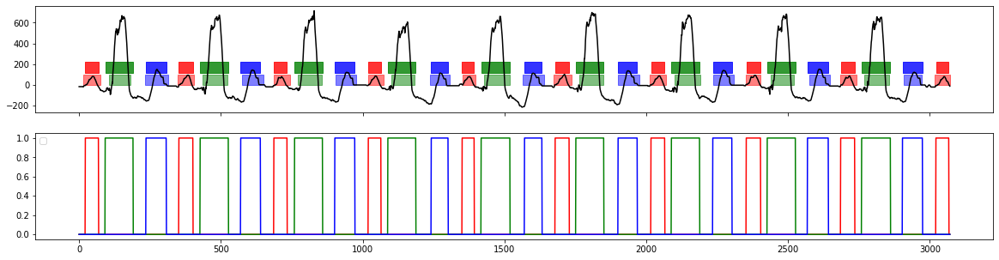

In [32]:
it = iter(val_loader)
model.eval()
with torch.no_grad():
    x_test,y_test,z_test = next(it)
    #x_test,y_test,z_test = next(it)
    #x_test,y_test,z_test = next(it)
    predict = model(x_test.permute((0, 2, 1))).permute((0, 2, 1))
    #predict = model(x_test).permute((0, 2, 1))
    #predict = get_softmax(predict)
    predict = F.one_hot(torch.argmax(predict, dim=2))
    predict = preproc(predict)


k = 0
print(z_test[k])
draw_prediction_and_reality(x_test[k,:,:], predict[k, :, :], y_test[k, :, :], "a")

In [35]:
# save_path = r'C:\Users\game-\Desktop\Учёба\Python\PyThorch\Transformer\graphs1'

In [84]:
"".join(z_test)

'Ритм синусовый, регулярный.\r\nНормальное положение ЭОС.\r\nГипертрофия левого предсердия, левого желудочка.Ритм синусовый, регулярный.\r\nВертикальное положение ЭОС.\r\nА-в-блокада 1ст.(PQ-0,22").\r\nГипертрофия левого предсердия, левого желудочка с перегрузкой.\r\nВозможно, ишемия в области нижне-боковой стенки(TI,II,avf,v6(-)Ритм синусовый, регулярный.\r\nОтклонение ЭОС влево.\r\nБлокада передней ветви левой ножки п.Гиса.\r\nГипертрофия левого предсердия. Рубцовые изменения в передне-перегородочно-верхушечно-боковой области. \r\nНельзя исключить наличие острой ишемии верхушечной, боковой области.Ритм синусовый, предсердная экстрасистолия.\r\nЭОС горизонтальная.\r\nПерегрузка ПП, гипертрофия ЛП.\r\nГипертрофия левого желудочка.\r\nОбширный передний(Q) инфаркт миокарда в острой фазе(QSv2-3, Qrv4, элевацияSTv2-3-4-5,(возможно, хр. аневризма левого желудочка).\r\nДинамика!'

torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size

C:\Users\game-\AppData\Local\Temp/ipykernel_1248/329235192.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f, ax1 = plt.subplots(1, 1, sharey=False, sharex=True, figsize=(15, 5))


torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size

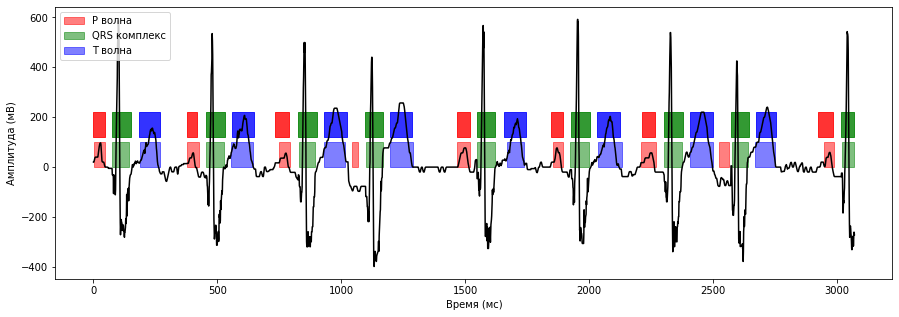

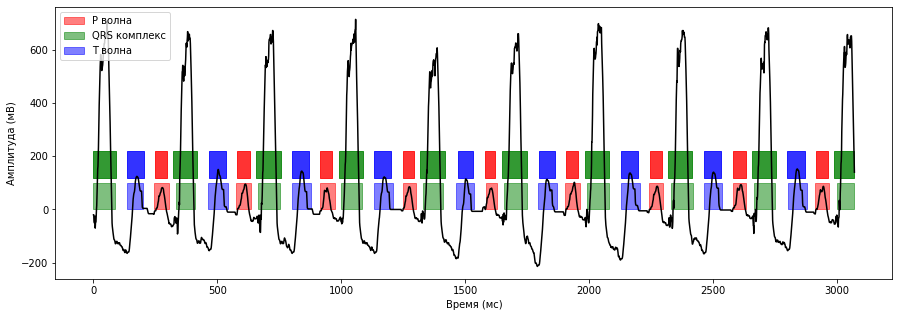

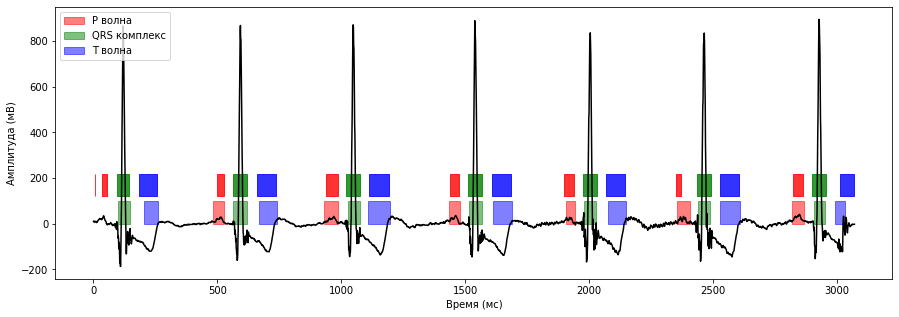

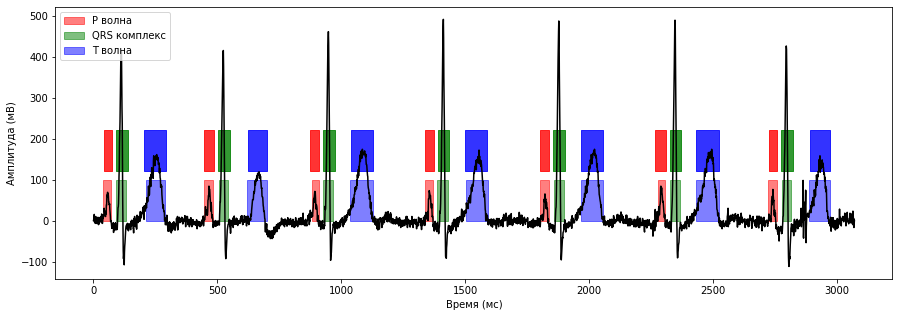

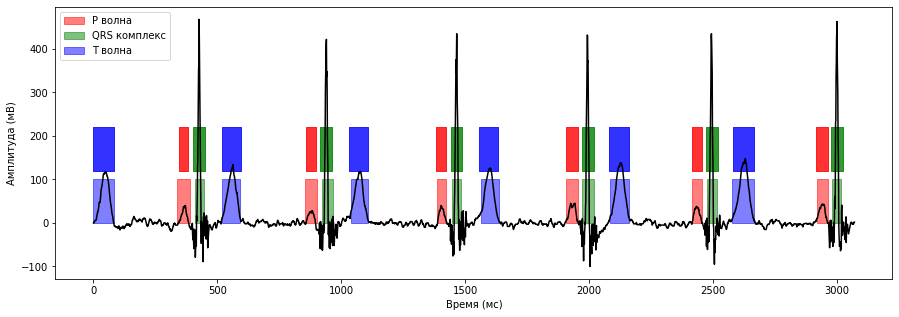

...

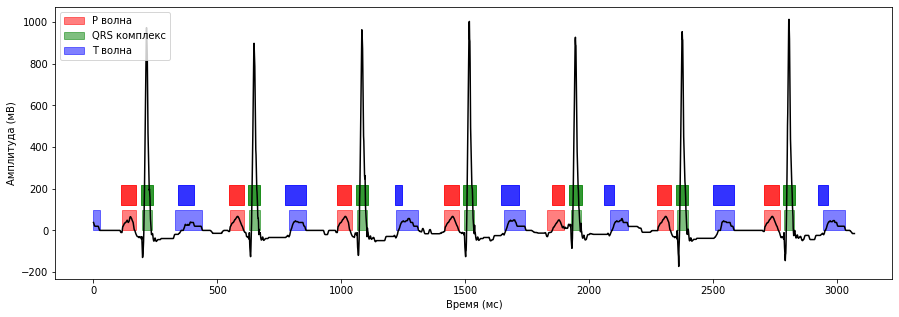

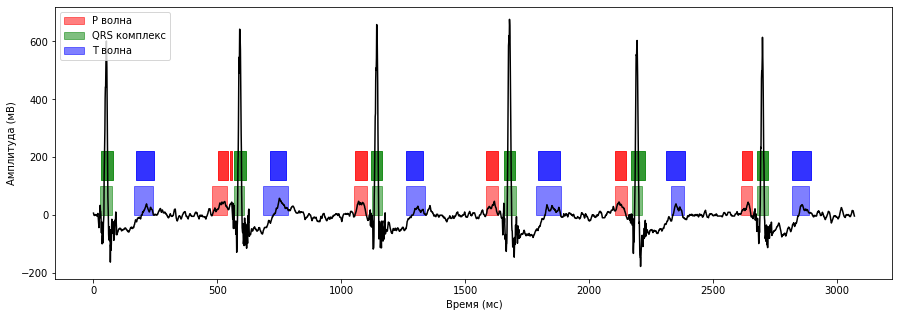

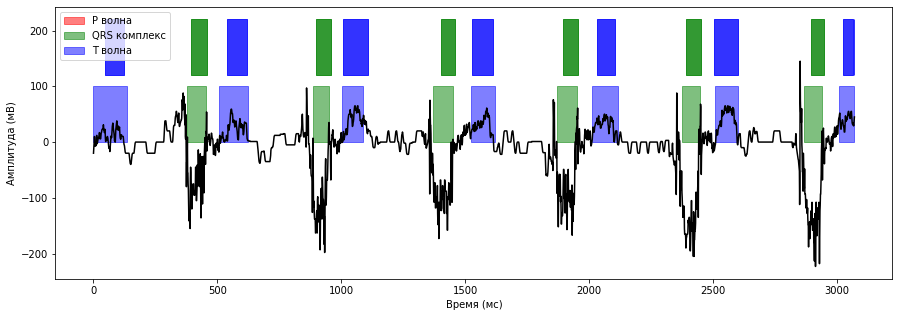

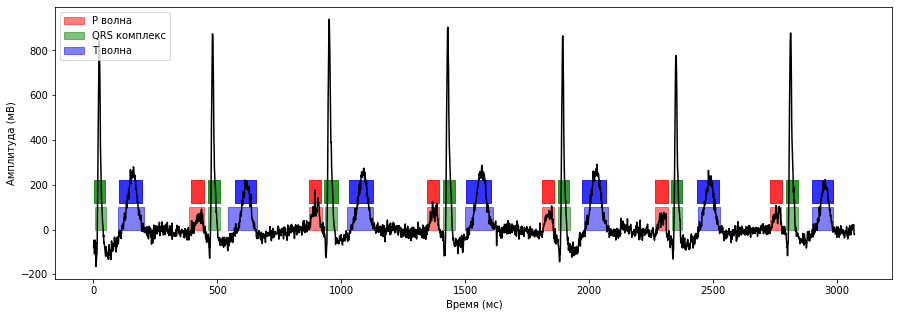

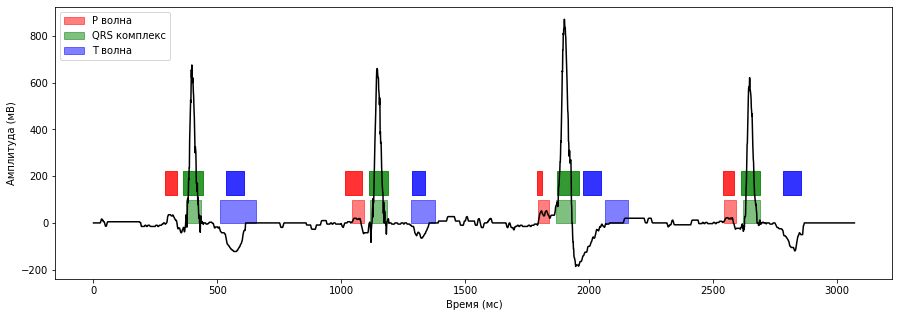

In [40]:
# j = 0
# model.eval()
# for x_test, y_test, z_test in val_loader:
#     with torch.no_grad():
#         predict = model(x_test.permute((0, 2, 1))).permute((0, 2, 1))
#         predict = F.one_hot(torch.argmax(predict, dim=2))
#         predict = preproc(predict)
#     for i in range(len(x_test)):
#         with open(save_path + f'\\{j}_desc.txt', 'w') as f:
#             f.write(z_test[i])
#             draw_prediction_and_reality_2(x_test[i,:,:], predict[i, :, :], y_test[i, :, :], save_path + f"\\{j}")
#             j += 1

In [39]:
it = iter(val_loader)

In [72]:
r = 1 #16

In [73]:
for _ in range(r):
    x_test,y_test,z_test = next(it)

In [101]:
j = 0
for x_test, y_test, z_test in val_loader:
    if j == r:
        break
    j += 1

In [62]:
model.eval()
with torch.no_grad():
    predict = model(x_test.permute((0, 2, 1))).permute((0, 2, 1))
    #predict = model(x_test).permute((0, 2, 1))
    #predict = get_softmax(predict)
    predict = F.one_hot(torch.argmax(predict, dim=2))
    predict = preproc(predict)

Ритм синусовый, регулярный.
Отклонение ЭОС влево.
Гипертрофия левого предсердия, левого желудочка.
Изменения миокарда в области передне-перегородочно-боковой стенки в виде(-)Tavl,v2-3-4,(-+)Tv5,
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)


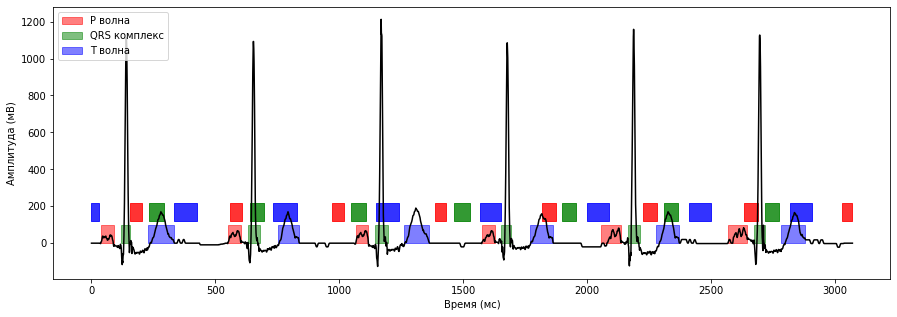

In [89]:
k = 2
print(z_test[k])
draw_prediction_and_reality_2(x_test[k,:,:], predict[k, :, :], y_test[k, :, :], "transformer")

In [75]:
unet.eval()
with torch.no_grad():
    unet_predict = unet(x_test.permute((0, 2, 1))).permute((0, 2, 1))
    #predict = model(x_test).permute((0, 2, 1))
    #predict = get_softmax(predict)
    unet_predict = F.one_hot(torch.argmax(unet_predict, dim=2))
    unet_predict = preproc(unet_predict)

Ритм синусовый, регулярный.
Отклонение ЭОС влево.
Гипертрофия левого предсердия, левого желудочка.
Изменения миокарда в области передне-перегородочно-боковой стенки в виде(-)Tavl,v2-3-4,(-+)Tv5,
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)


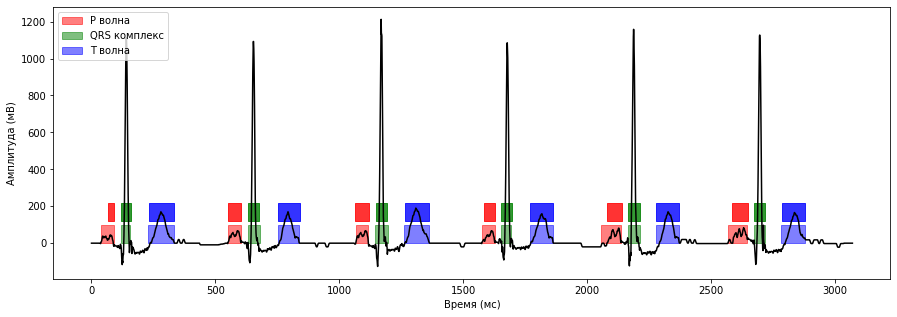

In [90]:
print(z_test[k])
draw_prediction_and_reality_2(x_test[k,:,:], unet_predict[k, :, :], y_test[k, :, :], "unet")

In [82]:
best_model.eval()
with torch.no_grad():
    best_model_predict = best_model(x_test.permute((0, 2, 1))).permute((0, 2, 1))
    #predict = model(x_test).permute((0, 2, 1))
    #predict = get_softmax(predict)
    best_model_predict = F.one_hot(torch.argmax(best_model_predict, dim=2))
    best_model_predict = preproc(best_model_predict)

Ритм синусовый, регулярный.
Отклонение ЭОС влево.
Гипертрофия левого предсердия, левого желудочка.
Изменения миокарда в области передне-перегородочно-боковой стенки в виде(-)Tavl,v2-3-4,(-+)Tv5,
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)


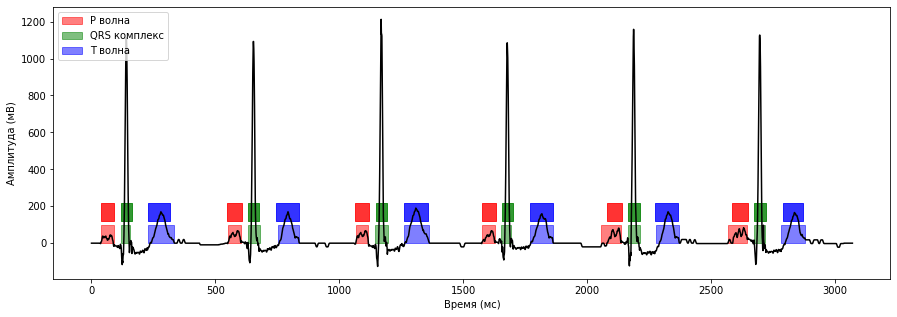

In [91]:
print(z_test[k])
draw_prediction_and_reality_2(x_test[k,:,:], best_model_predict[k, :, :], y_test[k, :, :], "best_model")

In [41]:
any_save_path = r'C:\Users\game-\Desktop\Учёба\Python\PyThorch\Transformer\comp'

torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size

C:\Users\game-\AppData\Local\Temp/ipykernel_17840/329235192.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f, ax1 = plt.subplots(1, 1, sharey=False, sharex=True, figsize=(15, 5))


torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size

torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size([3072, 12])
torch.Size([3072, 4])
(3072, 4)
torch.Size

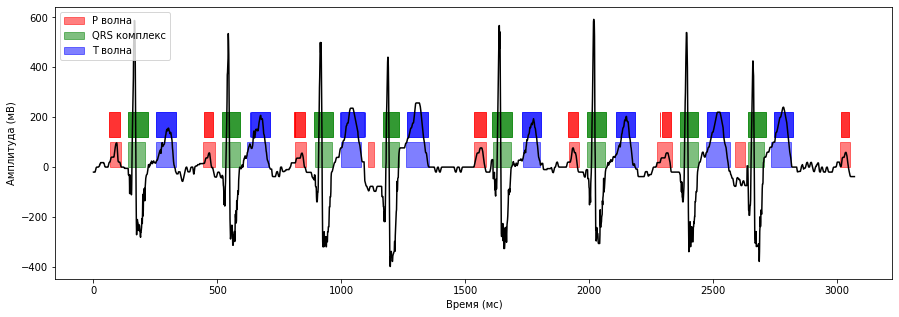

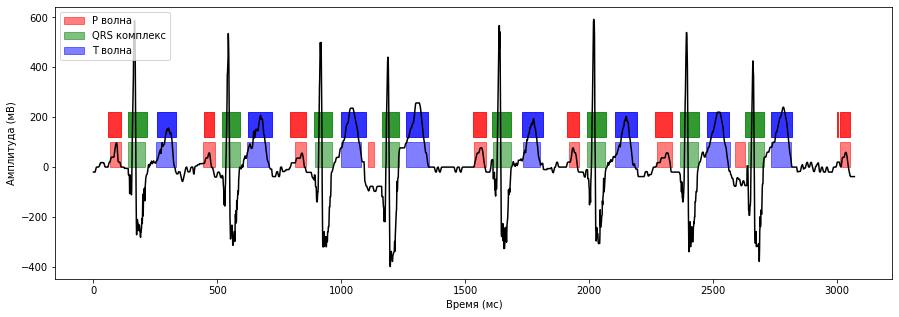

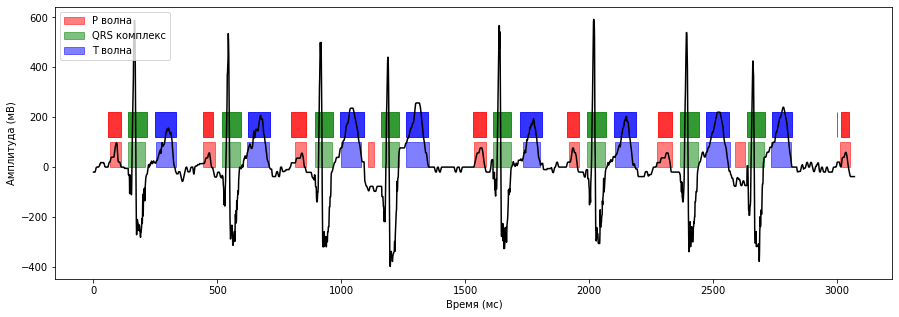

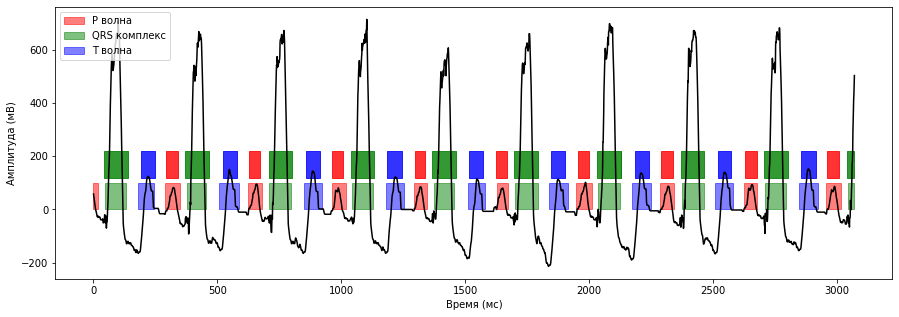

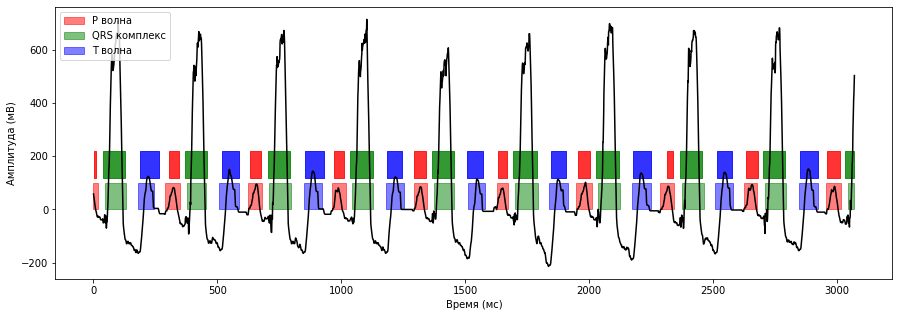

...

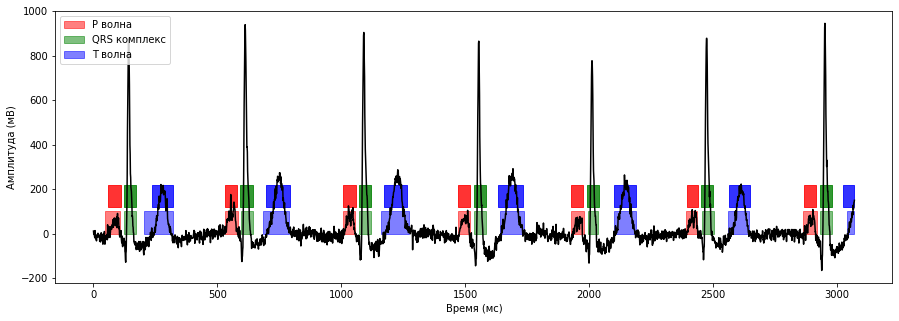

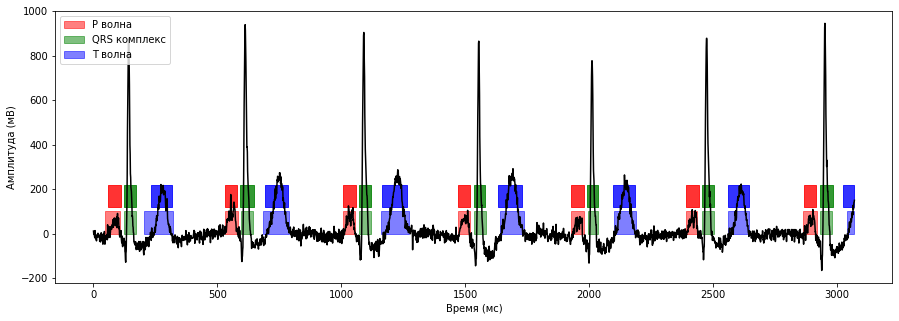

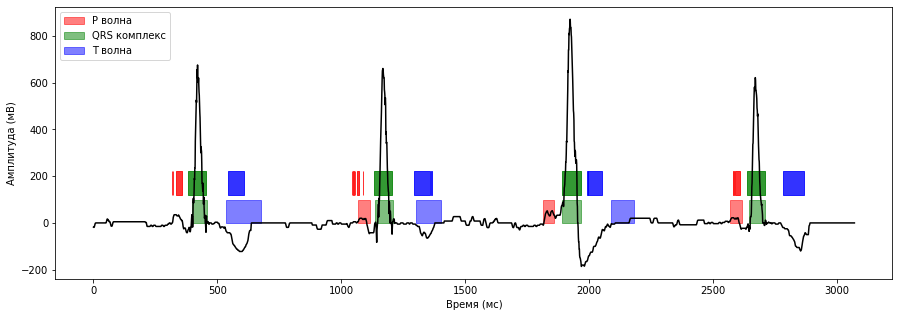

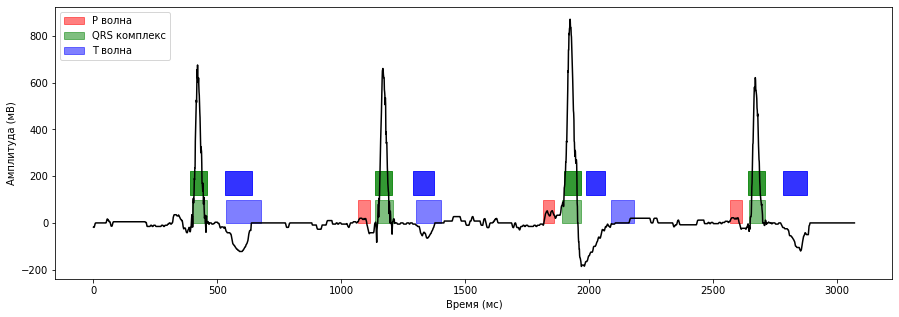

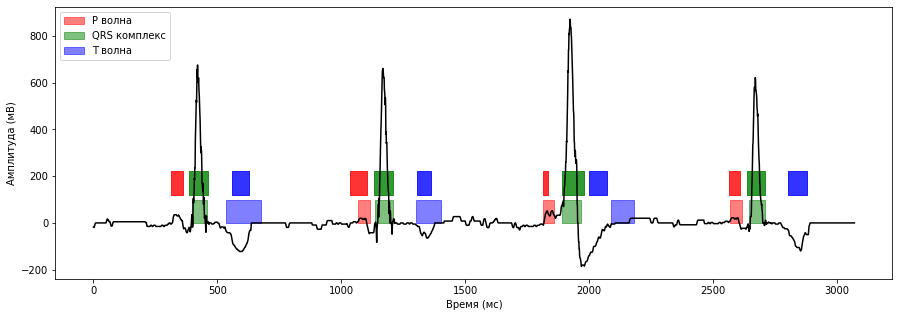

In [42]:
j = 0
for x_test, y_test, z_test in val_loader:
    model.eval()
    with torch.no_grad():
        predict = model(x_test.permute((0, 2, 1))).permute((0, 2, 1))
        predict = F.one_hot(torch.argmax(predict, dim=2))
        predict = preproc(predict)
        
    unet.eval()
    with torch.no_grad():
        unet_predict = unet(x_test.permute((0, 2, 1))).permute((0, 2, 1))
        unet_predict = F.one_hot(torch.argmax(unet_predict, dim=2))
        unet_predict = preproc(unet_predict)
        
    best_model.eval()
    with torch.no_grad():
        best_model_predict = best_model(x_test.permute((0, 2, 1))).permute((0, 2, 1))
        best_model_predict = F.one_hot(torch.argmax(best_model_predict, dim=2))
        best_model_predict = preproc(best_model_predict)
    
    for i in range(len(x_test)):
        with open(any_save_path + f'\\{j}_desc.txt', 'w') as f:
            f.write(z_test[i])
            draw_prediction_and_reality_2(x_test[i,:,:], predict[i, :, :], y_test[i, :, :], any_save_path + f"\\{j}_model")
            draw_prediction_and_reality_2(x_test[i,:,:], unet_predict[i, :, :], y_test[i, :, :], any_save_path + f"\\{j}_unet")
            draw_prediction_and_reality_2(x_test[i,:,:], best_model_predict[i, :, :], y_test[i, :, :], any_save_path + f"\\{j}_best")
            j += 1

In [35]:
predict

tensor([[[0, 0, 0, 1],
         [0, 0, 0, 1],
         [0, 0, 0, 1],
         ...,
         [0, 0, 0, 1],
         [0, 0, 0, 1],
         [0, 0, 0, 1]],

        [[0, 1, 0, 0],
         [0, 1, 0, 0],
         [0, 1, 0, 0],
         ...,
         [0, 1, 0, 0],
         [0, 1, 0, 0],
         [0, 1, 0, 0]],

        [[0, 0, 0, 1],
         [0, 0, 0, 1],
         [0, 0, 0, 1],
         ...,
         [0, 0, 0, 1],
         [0, 0, 0, 1],
         [0, 0, 0, 1]],

        [[1, 0, 0, 0],
         [1, 0, 0, 0],
         [1, 0, 0, 0],
         ...,
         [0, 0, 0, 1],
         [0, 0, 0, 1],
         [0, 0, 0, 1]]], device='cuda:0')

In [96]:
from sklearn.preprocessing import MinMaxScaler

In [97]:
mm = MinMaxScaler()

In [100]:
mm.fit_transform(predict.cpu().detach().numpy()[0, :, :])

array([[0.66395986, 0.67322594, 0.589437  , 0.69362867],
       [0.65253276, 0.6685836 , 0.58362263, 0.69925046],
       [0.17937118, 0.24078691, 0.13924351, 0.14632738],
       ...,
       [0.6083336 , 0.72196627, 0.5807092 , 0.7057991 ],
       [0.6033088 , 0.7214041 , 0.5824212 , 0.701069  ],
       [0.6105699 , 0.7096598 , 0.5825613 , 0.70665646]], dtype=float32)

In [24]:
from ray import air, tune
from ray.air import session
from ray.tune.schedulers import ASHAScheduler

In [25]:
def train_model_unet(model, optimizer, train_loader_):
    model.train()
    for X_batch, y_batch, _ in train_loader_:
        loss = get_loss(model, X_batch.to(device), y_batch.to(device), mock_func_active)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    return loss

In [26]:
def test_model_unet(model, val_loader_):
    model.eval()
    for X_batch, y_batch, _ in val_loader_:
        with torch.no_grad():
            loss = get_loss(model, X_batch.to(device), y_batch.to(device), mock_func_active)
    return loss

In [27]:
def get_table(model, data_x_test, data_y_test, dir_path):
    model.eval()
    with torch.no_grad():
        pred_test = model(torch.FloatTensor(data_x_test[:,1000:4072,:]).to(device).permute((0, 2, 1))).permute((0, 2, 1))
        #pred_test = model(torch.FloatTensor(X_test[:,:,:]).to(device)).permute((0, 2, 1))
        #pred_test = get_softmax(pred_test)
        #pred_test = pred_test.permute((0, 2, 1))
        #pred_test = to_one_hot_encode(pred_test)
        pred_test = F.one_hot(torch.argmax(pred_test, dim=2))
        pred_test = pred_test.cpu().detach().numpy()
    
    statistics(data_y_test[:, 1000:4072, :], pred_test[:, :, :]).round(4).to_csv(dir_path + '/table.csv')

In [30]:
import os
from ray.air.checkpoint import Checkpoint
def train_unet(config, data):
    
    dir_path = f"C:/Users/game-/Desktop/Учёба/Python/PyThorch/Transformer/UNet_Base/UNet_{config['unet_n_layers']}_{ config['start_scale']}"
    os.makedirs(dir_path, exist_ok=True)
    #checkpoint = Checkpoint.from_directory(dir_path)
    
    X_train, X_test, Y_train, Y_test, Z_train, Z_test = train_test_split(data['x'], data['y'], data['text'], test_size=0.33, random_state=42)
    
    train_loader = get_loader(X_train, Y_train, Z_train, win_len, batch_size, num_leads_signal)
    val_loader = get_loader(X_test, Y_test, Z_test, win_len, batch_size, num_leads_signal)
    
    num_epochs = 80
    
    model = UNetV2(12,4, config['unet_n_layers'], config['start_scale'])
    model.to(device)
    
    optimizer = torch.optim.AdamW(model.parameters(), lr=0.001)
    
    train_losses = []
    val_losses = []
    epoch = 0

    while num_epochs is None or epoch < num_epochs:
        
        loss = train_model_unet(model, optimizer, train_loader)
        train_losses.append(loss.cpu().data.numpy())

        loss = test_model_unet(model, val_loader)
        val_losses.append(loss.cpu().data.numpy())

        train_loss = np.mean(train_losses[-len(train_loader):])
        val_loss = np.mean(val_losses[-len(val_loader):])
        #print(len(train_loader), len(val_loader))
       #clear_output(True)
        #print("Epoch {} took {:.3f}s".format(epoch + 1, time.time() - start_time))
        #print("training loss: \t{:.6f}".format(train_loss))
        #print("validation loss: \t{:.6f}".format(val_loss))
        

       #if val_loss < min_loss - 1e-5:
       #    min_loss = val_loss
       #    min_loss_index = epoch
        #elif epoch - min_loss_index >= 10:
        #    break
        
        
        epoch += 1
        if epoch % 9 == 0:
            torch.save(model.state_dict(), dir_path + "/checkpoint.pt", _use_new_zipfile_serialization=False)
            #checkpoint = Checkpoint.from_directory(dir_path)
        #scheduler.step()
        #session.report({'train_loss': train_loss, "val_loss": val_loss}, checkpoint=checkpoint)
        session.report({'train_loss': train_loss, "val_loss": val_loss})
    get_table(model, X_test, Y_test, dir_path)

In [28]:
import ray
ray.init(log_to_driver=False)

2023-05-31 20:09:23,841	INFO worker.py:1625 -- Started a local Ray instance.


Python version:,3.8.11
Ray version:,2.4.0


In [38]:
import ray

In [39]:
ray.shutdown()

In [42]:
# search_space = {
#     "unet_n_layers": tune.choice([i for i in range(1,6)]),
#     "start_scale": tune.choice([2 ** i for i in range(5)]),
# }
# tuner = tune.Tuner(
#     tune.with_resources(
#         tune.with_parameters(train_unet, train_loader1=train_loader, val_loader1=val_loader),
#         resources={"cpu": 2, "gpu": 1}
#     ),
#     tune_config=tune.TuneConfig(
#         metric="loss",
#         mode="min"
#     ),
#     param_space=search_space,
# )
# results = tuner.fit()

In [31]:
from ray.tune.schedulers import MedianStoppingRule
def tune_unet():
    search_space = {
        "unet_n_layers": tune.grid_search([i for i in range(1,6)]),
        "start_scale": tune.grid_search([2 ** i for i in range(5)]),
    }
    # search_space = {
    #     "unet_n_layers": tune.choice([i for i in range(1,6)]),
    #     "start_scale": tune.choice([2 ** i for i in range(5)]),
    # }
    # search_space = {
    #     "unet_n_layers": tune.sample_from(lambda _: np.random.randint(1, 6)),
    #     "start_scale":  tune.sample_from(lambda _: 2 ** np.random.randint(0, 4)),
    # }
    tuner = tune.Tuner(
        tune.with_resources(
            tune.with_parameters(train_unet, data=data),
            resources={"cpu": 2, "gpu": 1}
        ),
        tune_config=tune.TuneConfig(
            metric="val_loss",
            mode="min"
        ),
        param_space=search_space,
        run_config=air.RunConfig(
            name="tune_unet",
            local_dir="./ray_log"
        ),
    )
    results = tuner.fit()
    results.get_dataframe().to_csv("C:/Users/game-/Desktop/Учёба/Python/PyThorch/Transformer/UNet_Base/res.csv")

In [ ]:
tune_unet()

In [31]:
import os
from ray.air.checkpoint import Checkpoint
def train_unet_opt(config, data):
    unet_n_layers = int(config['unet_n_layers'])
    start_scale = int(config['start_scale'])
    dir_path = f"C:/Users/game-/Desktop/Учёба/Python/PyThorch/Transformer/UNet_Opt/UNet_{unet_n_layers}_{start_scale}"
    os.makedirs(dir_path, exist_ok=True)
    #checkpoint = Checkpoint.from_directory(dir_path)
    loaded_checkpoint = session.get_checkpoint()

    
    X_train, X_test, Y_train, Y_test, Z_train, Z_test = train_test_split(data['x'], data['y'], data['text'], test_size=0.33, random_state=42)
    
    train_loader = get_loader(X_train, Y_train, Z_train, win_len, batch_size, num_leads_signal)
    val_loader = get_loader(X_test, Y_test, Z_test, win_len, batch_size, num_leads_signal)
    
    num_epochs = 80
    
    model = UNetV2(12,4, unet_n_layers, start_scale)
    model.to(device)
    
    if loaded_checkpoint:
        with loaded_checkpoint.as_directory() as loaded_checkpoint_dir:
            model_state = torch.load(os.path.join(loaded_checkpoint_dir, "checkpoint.pt"))
        model.load_state_dict(model_state)
    
    optimizer = torch.optim.AdamW(model.parameters(), lr=0.001)
    
    train_losses = []
    val_losses = []
    epoch = 0

    while num_epochs is None or epoch < num_epochs:
        
        loss = train_model_unet(model, optimizer, train_loader)
        train_losses.append(loss.cpu().data.numpy())

        loss = test_model_unet(model, val_loader)
        val_losses.append(loss.cpu().data.numpy())

        train_loss = np.mean(train_losses[-len(train_loader):])
        val_loss = np.mean(val_losses[-len(val_loader):])
        #print(len(train_loader), len(val_loader))
       #clear_output(True)
        #print("Epoch {} took {:.3f}s".format(epoch + 1, time.time() - start_time))
        #print("training loss: \t{:.6f}".format(train_loss))
        #print("validation loss: \t{:.6f}".format(val_loss))
        

       #if val_loss < min_loss - 1e-5:
       #    min_loss = val_loss
       #    min_loss_index = epoch
        #elif epoch - min_loss_index >= 10:
        #    break
        
        
        epoch += 1

        torch.save(model.state_dict(), dir_path + "/checkpoint.pt", _use_new_zipfile_serialization=False)
        checkpoint = Checkpoint.from_directory(dir_path)
        #scheduler.step()
        session.report({'train_loss': train_loss, "val_loss": val_loss}, checkpoint=checkpoint)
        #session.report({'train_loss': train_loss, "val_loss": val_loss})
    get_table(model, X_test, Y_test, dir_path)

In [55]:
from ray.tune.search.bayesopt import BayesOptSearch
def tune_unet_opt_b():
    search_space = {
        "unet_n_layers": tune.uniform(1,6),
        "start_scale": tune.uniform(1,17)
    }
#     search_space = {
#         "unet_n_layers": tune.grid_search([i for i in range(1,6)]),
#         "start_scale": tune.grid_search([2 ** i for i in range(5)]),
#     }
    alg = BayesOptSearch(metric="val_loss", mode="min")
    tuner = tune.Tuner(
        tune.with_resources(
            tune.with_parameters(train_unet_opt, data=data),
            resources={"cpu": 2, "gpu": 1}
        ),
        tune_config=tune.TuneConfig(
            metric="val_loss",
            mode="min",
            search_alg=alg,
            num_samples=30
        ),
        param_space=search_space,
        run_config=air.RunConfig(
            name="tune_unet",
            local_dir="./ray_log"
        ),
    )
    results = tuner.fit()
    results.get_dataframe().to_csv("C:/Users/game-/Desktop/Учёба/Python/PyThorch/Transformer/UNet_Base/res.csv")

In [32]:
from ray.tune.search.bohb import TuneBOHB
from ray.tune.schedulers import HyperBandForBOHB
def tune_unet_opt_BOHB():
#     search_space = {
#         "unet_n_layers": tune.uniform(1,6),
#         "start_scale": tune.uniform(1,17)
#     }
    search_space = {
        "unet_n_layers": tune.choice([i for i in range(1,6)]),
        "start_scale": tune.choice([2 ** i for i in range(5)]),
    }
    alg = TuneBOHB(metric="val_loss", mode="min")
    scheduler = HyperBandForBOHB(max_t=80,metric="val_loss", mode="min")
    tuner = tune.Tuner(
        tune.with_resources(
            tune.with_parameters(train_unet_opt, data=data),
            resources={"cpu": 2, "gpu": 1}
        ),
        tune_config=tune.TuneConfig(
            search_alg=alg,
            scheduler=scheduler,
            num_samples=10
        ),
        param_space=search_space,
        run_config=air.RunConfig(
            name="tune_unet",
            local_dir="./ray_log"
        ),
        
    )
    results = tuner.fit()
    results.get_dataframe().to_csv("C:/Users/game-/Desktop/Учёба/Python/PyThorch/Transformer/UNet_Base/res.csv")

In [ ]:
tune_unet_opt_BOHB()

In [31]:
from ray.tune.search.hebo import HEBOSearch
def tune_unet_opt_HEBO():
#     search_space = {
#         "unet_n_layers": tune.uniform(1,6),
#         "start_scale": tune.uniform(1,17)
#     }
    search_space = {
        "unet_n_layers": tune.choice([i for i in range(1,6)]),
        "start_scale": tune.choice([2 ** i for i in range(5)]),
    }
    alg = HEBOSearch(metric="val_loss", mode="min")
    tuner = tune.Tuner(
        tune.with_resources(
            tune.with_parameters(train_unet_opt, data=data),
            resources={"cpu": 2, "gpu": 1}
        ),
        tune_config=tune.TuneConfig(
            search_alg=alg,
            num_samples=30
        ),
        param_space=search_space,
        run_config=air.RunConfig(
            name="tune_unet",
            local_dir="./ray_log"
        ),
        
    )
    results = tuner.fit()
    results.get_dataframe().to_csv("C:/Users/game-/Desktop/Учёба/Python/PyThorch/Transformer/UNet_Base/res.csv")

In [32]:
tune_unet_opt_HEBO()

AssertionError: HEBO must be installed! You can install HEBO with the command: `pip install 'HEBO>=0.2.0'`.This error may also be caused if HEBO dependencies have bad versions. Try updating HEBO first.

In [ ]:
import ray
ray.init()
result = tune.run(
    train_unet,
    resources_per_trial={"cpu": 2, "gpu": 1},
    config=search_space
)

In [33]:
import ray

In [34]:
ray.shutdown()

In [55]:
from tqdm import tqdm

In [56]:
for unet_n_layers in tqdm(range(1,6)):
    for start_scale in tqdm([2 ** i for i in range(5)]):
        train_unet({'unet_n_layers': unet_n_layers, 'start_scale': start_scale})

2023-05-31 12:54:22,188	WARNING session.py:100 -- In neither tune session nor train session!


Epoch 80 took 0.829s
training loss: 	0.064113
validation loss: 	0.238698



100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [17:13<00:00, 206.61s/it]


In [37]:
from ray import cloudpickle as pickle

In [80]:
pickled = pickle.dumps(UNetV2(12,4,5,8))
length_mib = len(pickled) // (1024 * 1024)
print("Length mb: {}".format(length_mib))

Length mb: <torch.utils.data.dataloader.DataLoader object at 0x000001B204E942E0>


In [81]:
pickled = pickle.dumps(val_loader)
length_mib = len(pickled) // (1024 * 1024)
print("Length mb: {}".format(length_mib))

Length mb: 25


In [82]:
pickled = pickle.dumps(train_loader)
length_mib = len(pickled) // (1024 * 1024)
print("Length mb: {}".format(length_mib))

Length mb: 51


In [38]:
pickled = pickle.dumps(search_space)
length_mib = len(pickled) // (1024 * 1024)
print("Length mb: {}".format(length_mib))

Length mb: 0


In [66]:
pickled = pickle.dumps(get_table)
length_mib = len(pickled) // (1024 * 1024)
print("Length mb: {}".format(length_mib))

Length mb: 20


In [29]:
import os
from ray.air.checkpoint import Checkpoint
def train_unet_in_t(config, data):
    
    unet_n_layers = int(config['unet_n_layers'])
    start_scale = int(config['start_scale'])
    d_model = config['d_model']
    h = config['h']
    d_ff = config['d_ff']
    num_layers = config['num_layers']
    dropout = config['dropout']
    
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    dir_path = f"D:/Another_path/UNet_In_T/UNet_{unet_n_layers}_{start_scale}_{d_model}_{h}_{d_ff}_{num_layers}_{dropout}"
    os.makedirs(dir_path, exist_ok=True)
    #checkpoint = Checkpoint.from_directory(dir_path)
    loaded_checkpoint = session.get_checkpoint()

    
    X_train, X_test, Y_train, Y_test, Z_train, Z_test = train_test_split(data['x'], data['y'], data['text'], test_size=0.33, random_state=42)
    
    train_loader = get_loader(X_train, Y_train, Z_train, win_len, batch_size, num_leads_signal)
    val_loader = get_loader(X_test, Y_test, Z_test, win_len, batch_size, num_leads_signal)
    
    num_epochs = 80
    
    model = UNetInT(12,4, unet_n_layers, start_scale, d_model, h, d_ff, num_layers, dropout)
    model.to(device)
    
    if loaded_checkpoint:
        with loaded_checkpoint.as_directory() as loaded_checkpoint_dir:
            model_state = torch.load(os.path.join(loaded_checkpoint_dir, "checkpoint.pt"), map_location=device)
        model.load_state_dict(model_state)
    
    optimizer = torch.optim.AdamW(model.parameters(), lr=0.001)
    
    train_losses = []
    val_losses = []
    epoch = 0
    while num_epochs is None or epoch < num_epochs:
        
        loss = train_model_unet(model, optimizer, train_loader)
        train_losses.append(loss.cpu().data.numpy())

        loss = test_model_unet(model, val_loader)
        val_losses.append(loss.cpu().data.numpy())

        train_loss = np.mean(train_losses[-len(train_loader):])
        val_loss = np.mean(val_losses[-len(val_loader):])
        #print(len(train_loader), len(val_loader))
       #clear_output(True)
        #print("Epoch {} took {:.3f}s".format(epoch + 1, time.time() - start_time))
        #print("training loss: \t{:.6f}".format(train_loss))
        #print("validation loss: \t{:.6f}".format(val_loss))
        

       #if val_loss < min_loss - 1e-5:
       #    min_loss = val_loss
       #    min_loss_index = epoch
        #elif epoch - min_loss_index >= 10:
        #    break
        
        
        epoch += 1

        torch.save(model.state_dict(), dir_path + "/checkpoint.pt", _use_new_zipfile_serialization=False)
        checkpoint = Checkpoint.from_directory(dir_path)
        #scheduler.step()
        session.report({'train_loss': train_loss, "val_loss": val_loss}, checkpoint=checkpoint)
        #session.report({'train_loss': train_loss, "val_loss": val_loss})
        get_table(model, X_test, Y_test, dir_path)

In [30]:
from ray.tune.search.bohb import TuneBOHB
from ray.tune.schedulers import HyperBandForBOHB
def tune_unet_in_t_opt_BOHB():
#     search_space = {
#         "unet_n_layers": tune.uniform(1,6),
#         "start_scale": tune.uniform(1,17)
#     }
    search_space = {
        "unet_n_layers": tune.choice([i for i in range(1,6)]),
        "start_scale": tune.choice([2 ** i for i in range(5)]),
        "d_model": tune.choice([2 ** i for i in range(4,10)]),
        "h": tune.choice([2**i for i in range(3)]),
        "d_ff": tune.choice([2 ** i for i in range(6,12)]),
        "num_layers": tune.choice([i for i in range(1,7)]),
        "dropout": tune.uniform(0.05,0.55)
    }
    alg = TuneBOHB(metric="train_loss", mode="min")
    scheduler = HyperBandForBOHB(max_t=80,metric="train_loss", mode="min")
    tuner = tune.Tuner(
        tune.with_resources(
            tune.with_parameters(train_unet_in_t, data=data),
            resources={"cpu": 4, "gpu": 1}
        ),
        tune_config=tune.TuneConfig(
            search_alg=alg,
            scheduler=scheduler,
            num_samples=1000
        ),
        param_space=search_space,
        run_config=air.RunConfig(
            name="tune_unet_in_t",
            local_dir="D:/Another_path/ray_log_2"
        ),
        
    )
  
    results = tuner.fit()
    print(results.get_best_result("val_loss", mode="min"))
    results.get_dataframe().to_csv("D:/Another_path/UNet_In_T_2/res.csv")

In [ ]:
tune_unet_in_t_opt_BOHB()

In [40]:
from ray.tune.search.bohb import TuneBOHB
from ray.tune.schedulers import HyperBandForBOHB
import ray
def tune_unet_in_t_opt_BOHB_restore_2():
    
    search_space = {
    "unet_n_layers": tune.choice([i for i in range(1,6)]),
    "start_scale": tune.choice([2 ** i for i in range(5)]),
    "d_model": tune.choice([2 ** i for i in range(4,10)]),
    "h": tune.choice([2**i for i in range(3)]),
    "d_ff": tune.choice([2 ** i for i in range(6,12)]),
    "num_layers": tune.choice([i for i in range(1,7)]),
    "dropout": tune.uniform(0.05,0.55)
    }
    
    alg = TuneBOHB(metric="train_loss", mode="min")
    alg.restore_from_dir("D:/Another_path/ray_log_2/tune_unet_in_t/")
    scheduler = HyperBandForBOHB(max_t=80,metric="train_loss", mode="min")
    ray.init()
    
    params = tune.with_resources(
             tune.with_parameters(train_unet_in_t, data=data),
             resources={"cpu": 4, "gpu": 1}
             )
    
    tuner = tune.Tuner(
        tune.with_resources(
            tune.with_parameters(train_unet_in_t, data=data),
            resources={"cpu": 4, "gpu": 1}
        ),
        tune_config=tune.TuneConfig(
            search_alg=alg,
            scheduler=scheduler,
            num_samples=1000
        ),
        param_space=search_space,
        run_config=air.RunConfig(
            name="tune_unet_in_t",
            local_dir="D:/Another_path/ray_log_2"
        ),
        
    )
    tuner = tuner.restore("D:/Another_path/ray_log_2/tune_unet_in_t/", trainable=params, resume_errored=True)
    results = tuner.fit()
    print(results.get_best_result("val_loss", mode="min"))
    results.get_dataframe().to_csv("D:/Another_path/UNet_In_T_2/res.csv")

In [ ]:
tune_unet_in_t_opt_BOHB_restore_2()

In [31]:
from ray.tune.search.bohb import TuneBOHB
from ray.tune.schedulers import HyperBandForBOHB
import ray
def tune_unet_in_t_opt_BOHB_restore():
    
    search_space = {
    "unet_n_layers": tune.choice([i for i in range(1,6)]),
    "start_scale": tune.choice([2 ** i for i in range(5)]),
    "d_model": tune.choice([2 ** i for i in range(4,10)]),
    "h": tune.choice([2**i for i in range(3)]),
    "d_ff": tune.choice([2 ** i for i in range(6,12)]),
    "num_layers": tune.choice([i for i in range(1,7)]),
    "dropout": tune.uniform(0.05,0.55)
    }
    
    alg = TuneBOHB(metric="train_loss", mode="min")
    alg.restore_from_dir("D:/Another_path/ray_log/tune_unet_in_t/")
    scheduler = HyperBandForBOHB(max_t=80,metric="train_loss", mode="min")
    ray.init()
    
    params = tune.with_resources(
             tune.with_parameters(train_unet_in_t, data=data),
             resources={"cpu": 4, "gpu": 1}
             )
    
    tuner = tune.Tuner(
        tune.with_resources(
            tune.with_parameters(train_unet_in_t, data=data),
            resources={"cpu": 4, "gpu": 1}
        ),
        tune_config=tune.TuneConfig(
            search_alg=alg,
            scheduler=scheduler,
            num_samples=1000
        ),
        param_space=search_space,
        run_config=air.RunConfig(
            name="tune_unet_in_t",
            local_dir="D:/Another_path/ray_log"
        ),
        
    )
    tuner = tuner.restore("D:/Another_path/ray_log/tune_unet_in_t/", trainable=params, resume_errored=True)
    results = tuner.fit()
    print(results.get_best_result("val_loss", mode="min"))
    results.get_dataframe().to_csv("D:/Another_path/UNet_In_T/res.csv")

In [34]:
ray.shutdown()

In [ ]:
tune_unet_in_t_opt_BOHB_restore()

In [31]:
tune_unet_in_t_opt_BOHB()

2023-06-03 09:36:08,270	INFO worker.py:1625 -- Started a local Ray instance.
2023-06-03 09:36:13,183	INFO tune.py:218 -- Initializing Ray automatically. For cluster usage or custom Ray initialization, call `ray.init(...)` before `Tuner(...)`.
C:\Users\game-\anaconda3\envs\PyThorch\lib\site-packages\ray\tune\experiment\experiment.py:170: UserWarning: The `local_dir` argument of `Experiment is deprecated. Use `storage_path` or set the `TUNE_RESULT_DIR` environment variable instead.
  warnings.warn(


Trial name,date,done,hostname,iterations_since_restore,node_ip,pid,should_checkpoint,time_since_restore,time_this_iter_s,time_total_s,timestamp,train_loss,training_iteration,trial_id,val_loss
train_unet_in_t_0089efb8,2023-06-03_11-01-48,False,DESKTOP-U7I77K8,4,127.0.0.1,12144,True,27.9502,7.47699,40.9973,1685779308,0.514626,6,0089efb8,0.492535
train_unet_in_t_014add8a,2023-06-03_09-57-31,False,DESKTOP-U7I77K8,2,127.0.0.1,12144,True,207.619,132.777,207.619,1685775451,1.35914,2,014add8a,nan
train_unet_in_t_0a45d194,2023-06-03_23-49-37,False,DESKTOP-U7I77K8,80,127.0.0.1,12144,True,1198.29,15.0278,1198.29,1685825377,0.112843,80,0a45d194,0.509379
train_unet_in_t_0cbae349,2023-06-03_10-15-38,False,DESKTOP-U7I77K8,2,127.0.0.1,12144,True,35.866,28.42,35.866,1685776538,1.20143,2,0cbae349,nan
train_unet_in_t_0d26f6ae,2023-06-03_15-12-08,True,DESKTOP-U7I77K8,32,127.0.0.1,12144,True,1727.85,54.0155,3021.73,1685794328,0.116279,56,0d26f6ae,nan
train_unet_in_t_1411a032,2023-06-03_10-18-24,False,DESKTOP-U7I77K8,2,127.0.0.1,12144,True,166.461,114.795,166.461,1685776704,1.31811,2,1411a032,nan
train_unet_in_t_1b83558c,2023-06-03_11-36-56,True,DESKTOP-U7I77K8,4,127.0.0.1,12144,True,173.72,52.4297,241.495,1685781416,0.379339,6,1b83558c,nan
train_unet_in_t_1d359671,2023-06-03_10-05-50,False,DESKTOP-U7I77K8,2,127.0.0.1,12144,True,9.24975,5.65437,9.24975,1685775950,0.970328,2,1d359671,0.946422
train_unet_in_t_1f15f1ac,2023-06-03_09-36-44,False,DESKTOP-U7I77K8,2,127.0.0.1,12144,True,18.5254,8.95604,18.5254,1685774204,0.969956,2,1f15f1ac,1.15579
train_unet_in_t_28d94e35,2023-06-03_17-27-43,False,DESKTOP-U7I77K8,26,127.0.0.1,12144,True,281.307,10.8779,281.307,1685802463,0.847508,26,28d94e35,0.812988


(train_unet_in_t pid=12144) C:\Users\game-\Desktop\Учёба\Python\PyThorch\Transformer\metrics.py:134: RuntimeWarning: invalid value encountered in longlong_scalars
(train_unet_in_t pid=12144)   df_res.at['PPV', index] = df_stat.loc['tp', index] / (df_stat.loc['tp', index] + df_stat.loc['fp', index])
(train_unet_in_t pid=12144) C:\Users\game-\anaconda3\envs\PyThorch\lib\site-packages\numpy\core\fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
(train_unet_in_t pid=12144)   return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
(train_unet_in_t pid=12144) C:\Users\game-\anaconda3\envs\PyThorch\lib\site-packages\numpy\core\_methods.py:221: RuntimeWarning: invalid value encountered in true_divide
(train_unet_in_t pid=12144)   arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
(train_unet_in_t pid=12144) C:\Users\game-\anaconda3\envs\PyThorch\lib\site-packages\numpy\core\_methods.py:253: RuntimeWarning: invalid value encountered in double_

(train_unet_in_t pid=12144) 2023-06-03 11:34:02,716	INFO trainable.py:913 -- Restored on 127.0.0.1 from checkpoint: D:\Another_path\ray_log\tune_unet_in_t\train_unet_in_t_1b83558c_32_d_ff=128,d_model=512,dropout=0.2658,h=1,num_layers=3,start_scale=16,unet_n_layers=3_2023-06-03_10-38-36\checkpoint_tmpc2228f
(train_unet_in_t pid=12144) 2023-06-03 11:34:02,716	INFO trainable.py:922 -- Current state after restoring: {'_iteration': 2, '_timesteps_total': None, '_time_total': 67.77484631538391, '_episodes_total': None}
(train_unet_in_t pid=12144) 2023-06-03 11:36:56,810	INFO trainable.py:913 -- Restored on 127.0.0.1 from checkpoint: D:\Another_path\ray_log\tune_unet_in_t\train_unet_in_t_2ee33ef9_25_d_ff=2048,d_model=512,dropout=0.3781,h=4,num_layers=3,start_scale=16,unet_n_layers=5_2023-06-03_10-25-39\checkpoint_tmp3a4375
(train_unet_in_t pid=12144) 2023-06-03 11:36:56,810	INFO trainable.py:922 -- Current state after restoring: {'_iteration': 6, '_timesteps_total': None, '_time_total': 868.0

(train_unet_in_t pid=16276) C:\Users\game-\Desktop\Учёба\Python\PyThorch\Transformer\metrics.py:134: RuntimeWarning: invalid value encountered in longlong_scalars
(train_unet_in_t pid=16276)   df_res.at['PPV', index] = df_stat.loc['tp', index] / (df_stat.loc['tp', index] + df_stat.loc['fp', index])
(train_unet_in_t pid=16276) C:\Users\game-\anaconda3\envs\PyThorch\lib\site-packages\numpy\core\fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
(train_unet_in_t pid=16276)   return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
(train_unet_in_t pid=16276) C:\Users\game-\anaconda3\envs\PyThorch\lib\site-packages\numpy\core\_methods.py:221: RuntimeWarning: invalid value encountered in true_divide
(train_unet_in_t pid=16276)   arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
(train_unet_in_t pid=16276) C:\Users\game-\anaconda3\envs\PyThorch\lib\site-packages\numpy\core\_methods.py:253: RuntimeWarning: invalid value encountered in double_

In [32]:
torch.cuda.memory_stats(device)

OrderedDict()

In [ ]:
torch.cuda.memory_summary(device)

In [26]:
[i for i in range(1,6)]

[1, 2, 3, 4, 5]

In [27]:
[2 ** i for i in range(5)]

[1, 2, 4, 8, 16]

In [28]:
[2 ** i for i in range(4,12)]

[16, 32, 64, 128, 256, 512, 1024, 2048]

In [29]:
[2**i for i in range(4)]

[1, 2, 4, 8]

In [30]:
[2 ** i for i in range(6,14)]

[64, 128, 256, 512, 1024, 2048, 4096, 8192]

In [31]:
[i for i in range(1,9)]

[1, 2, 3, 4, 5, 6, 7, 8]

In [31]:
import os
from ray.air.checkpoint import Checkpoint
def train_unet_middle_t(config, data):
    
    unet_n_layers = int(config['unet_n_layers'])
    start_scale = int(config['start_scale'])
    d_model = config['d_model']
    h = config['h']
    d_ff = config['d_ff']
    num_layers = config['num_layers']
    dropout = config['dropout']
    
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    dir_path = f"D:/Another_path/UNet_Middle_T/UNet_{unet_n_layers}_{start_scale}_{d_model}_{h}_{d_ff}_{num_layers}_{dropout}"
    os.makedirs(dir_path, exist_ok=True)
    #checkpoint = Checkpoint.from_directory(dir_path)
    loaded_checkpoint = session.get_checkpoint()

    
    X_train, X_test, Y_train, Y_test, Z_train, Z_test = train_test_split(data['x'], data['y'], data['text'], test_size=0.33, random_state=42)
    
    train_loader = get_loader(X_train, Y_train, Z_train, win_len, batch_size, num_leads_signal)
    val_loader = get_loader(X_test, Y_test, Z_test, win_len, batch_size, num_leads_signal)
    
    num_epochs = 80
    
    model = UNetMiddleT(12,4, unet_n_layers, start_scale, d_model, h, d_ff, num_layers, dropout)
    model.to(device)
    
    if loaded_checkpoint:
        with loaded_checkpoint.as_directory() as loaded_checkpoint_dir:
            model_state = torch.load(os.path.join(loaded_checkpoint_dir, "checkpoint.pt"), map_location=device)
        model.load_state_dict(model_state)
    
    optimizer = torch.optim.AdamW(model.parameters(), lr=0.001)
    
    train_losses = []
    val_losses = []
    epoch = 0
    while num_epochs is None or epoch < num_epochs:
        
        loss = train_model_unet(model, optimizer, train_loader)
        train_losses.append(loss.cpu().data.numpy())

        loss = test_model_unet(model, val_loader)
        val_losses.append(loss.cpu().data.numpy())

        train_loss = np.mean(train_losses[-len(train_loader):])
        val_loss = np.mean(val_losses[-len(val_loader):])
        #print(len(train_loader), len(val_loader))
       #clear_output(True)
        #print("Epoch {} took {:.3f}s".format(epoch + 1, time.time() - start_time))
        #print("training loss: \t{:.6f}".format(train_loss))
        #print("validation loss: \t{:.6f}".format(val_loss))
        

       #if val_loss < min_loss - 1e-5:
       #    min_loss = val_loss
       #    min_loss_index = epoch
        #elif epoch - min_loss_index >= 10:
        #    break
        
        
        epoch += 1

        torch.save(model.state_dict(), dir_path + "/checkpoint.pt", _use_new_zipfile_serialization=False)
        checkpoint = Checkpoint.from_directory(dir_path)
        #scheduler.step()
        session.report({'train_loss': train_loss, "val_loss": val_loss}, checkpoint=checkpoint)
        #session.report({'train_loss': train_loss, "val_loss": val_loss})
        get_table(model, X_test, Y_test, dir_path)

In [32]:
from ray.tune.search.bohb import TuneBOHB
from ray.tune.schedulers import HyperBandForBOHB
def tune_unet_middle_t_opt_BOHB():
#     search_space = {
#         "unet_n_layers": tune.uniform(1,6),
#         "start_scale": tune.uniform(1,17)
#     }
    search_space = {
        "unet_n_layers": tune.choice([i for i in range(1,6)]),
        "start_scale": tune.choice([2 ** i for i in range(5)]),
        "d_model": tune.choice([2 ** i for i in range(4,10)]),
        "h": tune.choice([2**i for i in range(3)]),
        "d_ff": tune.choice([2 ** i for i in range(6,12)]),
        "num_layers": tune.choice([i for i in range(1,7)]),
        "dropout": tune.uniform(0.05,0.55)
    }
    alg = TuneBOHB(metric="val_loss", mode="min")
    scheduler = HyperBandForBOHB(max_t=80,metric="val_loss", mode="min")
    tuner = tune.Tuner(
        tune.with_resources(
            tune.with_parameters(train_unet_middle_t, data=data),
            resources={"cpu": 4, "gpu": 1}
        ),
        tune_config=tune.TuneConfig(
            search_alg=alg,
            scheduler=scheduler,
            num_samples=1000
        ),
        param_space=search_space,
        run_config=air.RunConfig(
            name="tune_unet_middle_t",
            local_dir="D:/Another_path/ray_log"
        ),
        
    )
  
    results = tuner.fit()
    print(results.get_best_result("val_loss", mode="min"))
    results.get_dataframe().to_csv("D:/Another_path/UNet_Middle_T/res.csv")

In [33]:
tune_unet_middle_t_opt_BOHB()

2023-06-05 23:41:11,919	INFO worker.py:1625 -- Started a local Ray instance.
2023-06-05 23:41:17,173	INFO tune.py:218 -- Initializing Ray automatically. For cluster usage or custom Ray initialization, call `ray.init(...)` before `Tuner(...)`.
C:\Users\game-\anaconda3\envs\PyThorch\lib\site-packages\ray\tune\experiment\experiment.py:170: UserWarning: The `local_dir` argument of `Experiment is deprecated. Use `storage_path` or set the `TUNE_RESULT_DIR` environment variable instead.
  warnings.warn(


Trial name,date,done,hostname,iterations_since_restore,node_ip,pid,should_checkpoint,time_since_restore,time_this_iter_s,time_total_s,timestamp,train_loss,training_iteration,trial_id,val_loss
train_unet_middle_t_001d1727,2023-06-06_08-44-10,False,DESKTOP-U7I77K8,4,127.0.0.1,9696,True,42.8299,11.6603,62.3021,1686030250,0.263221,6,001d1727,0.359239
train_unet_middle_t_004339e4,2023-06-06_07-49-12,False,DESKTOP-U7I77K8,2,127.0.0.1,9696,True,12.934,7.45862,12.934,1686026952,0.476151,2,004339e4,0.67186
train_unet_middle_t_00b695da,2023-06-06_08-55-28,False,DESKTOP-U7I77K8,4,127.0.0.1,9696,True,172.521,43.7843,257.464,1686030928,0.276727,6,00b695da,0.325389
train_unet_middle_t_00cf9690,2023-06-06_07-55-11,False,DESKTOP-U7I77K8,2,127.0.0.1,9696,True,8.76643,5.05763,8.76643,1686027311,1.23008,2,00cf9690,1.22917
train_unet_middle_t_01cbc72c,2023-06-06_07-31-14,False,DESKTOP-U7I77K8,80,127.0.0.1,9696,True,723.526,8.44627,723.526,1686025874,0.0673768,80,01cbc72c,0.379786
train_unet_middle_t_0341d1b0,2023-06-06_08-07-42,False,DESKTOP-U7I77K8,2,127.0.0.1,9696,True,740.632,375.336,740.632,1686028062,1.18518,2,0341d1b0,1.11812
train_unet_middle_t_03d91895,2023-06-06_08-37-43,False,DESKTOP-U7I77K8,6,127.0.0.1,9696,True,28.7004,4.63795,28.7004,1686029863,0.392742,6,03d91895,0.398878
train_unet_middle_t_059edd4a,2023-06-06_08-19-07,False,DESKTOP-U7I77K8,2,127.0.0.1,9696,True,28.2973,15.1721,28.2973,1686028747,0.55302,2,059edd4a,0.634891
train_unet_middle_t_065b6632,2023-06-05_23-45-25,False,DESKTOP-U7I77K8,2,127.0.0.1,9696,True,21.0923,11.1723,21.0923,1685997925,0.558483,2,065b6632,0.698315
train_unet_middle_t_06cc4900,2023-06-06_00-40-00,False,DESKTOP-U7I77K8,8,127.0.0.1,9696,True,54.7877,7.15603,54.7877,1686001200,0.293792,8,06cc4900,0.421872


(train_unet_middle_t pid=9696) C:\Users\game-\Desktop\Учёба\Python\PyThorch\Transformer\metrics.py:134: RuntimeWarning: invalid value encountered in longlong_scalars
(train_unet_middle_t pid=9696)   df_res.at['PPV', index] = df_stat.loc['tp', index] / (df_stat.loc['tp', index] + df_stat.loc['fp', index])
(train_unet_middle_t pid=9696) C:\Users\game-\anaconda3\envs\PyThorch\lib\site-packages\numpy\core\fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
(train_unet_middle_t pid=9696)   return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
(train_unet_middle_t pid=9696) C:\Users\game-\anaconda3\envs\PyThorch\lib\site-packages\numpy\core\_methods.py:221: RuntimeWarning: invalid value encountered in true_divide
(train_unet_middle_t pid=9696)   arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
(train_unet_middle_t pid=9696) C:\Users\game-\anaconda3\envs\PyThorch\lib\site-packages\numpy\core\_methods.py:253: RuntimeWarning: invalid value e

(train_unet_middle_t pid=9696) 2023-06-05 23:59:55,430	INFO trainable.py:913 -- Restored on 127.0.0.1 from checkpoint: D:\Another_path\ray_log\tune_unet_middle_t\train_unet_middle_t_37530fe1_31_d_ff=512,d_model=32,dropout=0.1574,h=2,num_layers=4,start_scale=16,unet_n_layers=3_2023-06-05_23-52-04\checkpoint_tmp1f58ea
(train_unet_middle_t pid=9696) 2023-06-05 23:59:55,430	INFO trainable.py:922 -- Current state after restoring: {'_iteration': 2, '_timesteps_total': None, '_time_total': 4.3539347648620605, '_episodes_total': None}
(train_unet_middle_t pid=9696) 2023-06-06 00:00:05,759	INFO trainable.py:913 -- Restored on 127.0.0.1 from checkpoint: D:\Another_path\ray_log\tune_unet_middle_t\train_unet_middle_t_d1c4193c_33_d_ff=256,d_model=16,dropout=0.2958,h=2,num_layers=6,start_scale=16,unet_n_layers=3_2023-06-05_23-52-15\checkpoint_tmpc2f6fb
(train_unet_middle_t pid=9696) 2023-06-06 00:00:05,759	INFO trainable.py:922 -- Current state after restoring: {'_iteration': 2, '_timesteps_total': 

bandwidth of the KDEs:
[9.74833251e-01 1.51577058e+00 1.09071610e-01 4.38709238e-01
 1.57798170e+00 1.00000000e-03 1.38297825e+00]
[1.38509051 1.45007361 0.1849583  0.5444102  1.27910568 1.07120529
 0.97530894]
l(x) = nan
g(x) = 9.559241056771184e-05
(train_unet_middle_t pid=9696) 2023-06-06 00:48:06,211	INFO trainable.py:913 -- Restored on 127.0.0.1 from checkpoint: D:\Another_path\ray_log\tune_unet_middle_t\train_unet_middle_t_85567fbd_36_d_ff=128,d_model=128,dropout=0.2246,h=4,num_layers=3,start_scale=16,unet_n_layers=2_2023-06-06_00-30-44\checkpoint_tmpdc1f10
(train_unet_middle_t pid=9696) 2023-06-06 00:48:06,211	INFO trainable.py:922 -- Current state after restoring: {'_iteration': 8, '_timesteps_total': None, '_time_total': 67.81636929512024, '_episodes_total': None}
(train_unet_middle_t pid=9696) 2023-06-06 00:50:30,849	INFO trainable.py:913 -- Restored on 127.0.0.1 from checkpoint: D:\Another_path\ray_log\tune_unet_middle_t\train_unet_middle_t_e3c63bc4_39_d_ff=64,d_model=128,dr

bandwidth of the KDEs:
[1.59073739e+00 1.14124281e+00 1.06357508e-01 4.09213817e-01
 1.44357066e+00 1.00000000e-03 1.25758833e+00]
[1.30161716 1.37724032 0.14359644 0.48975409 1.1971965  0.81266399
 0.89781982]
l(x) = nan
g(x) = 3.019898145544119e-05
sampled vector: [0, 0, 0.29825266961393826, 0, 5, 1, 4] has EI value nan
data in the KDEs:
[[1.         2.         0.17815202 1.         0.         4.
  1.        ]
 [0.         2.         0.32602766 2.         3.         4.
  0.        ]
 [5.         2.         0.08237994 2.         1.         4.
  0.        ]
 [0.         2.         0.24348863 2.         0.         4.
  0.        ]
 [0.         1.         0.28305144 2.         3.         4.
  0.        ]
 [1.         1.         0.38712703 2.         2.         4.
  4.        ]
 [4.         0.         0.51610294 2.         5.         4.
  3.        ]
 [0.         5.         0.38883164 1.         0.         4.
  0.        ]
 [3.         1.         0.21473661 1.         3.         4.
  2.  

(train_unet_middle_t pid=9696) 2023-06-06 04:03:52,331	INFO trainable.py:913 -- Restored on 127.0.0.1 from checkpoint: D:\Another_path\ray_log\tune_unet_middle_t\train_unet_middle_t_a97e037a_83_d_ff=64,d_model=32,dropout=0.1915,h=4,num_layers=4,start_scale=16,unet_n_layers=1_2023-06-06_03-44-54\checkpoint_tmp897290
(train_unet_middle_t pid=9696) 2023-06-06 04:03:52,331	INFO trainable.py:922 -- Current state after restoring: {'_iteration': 2, '_timesteps_total': None, '_time_total': 225.15343356132507, '_episodes_total': None}
(train_unet_middle_t pid=9696) 2023-06-06 04:11:26,281	INFO trainable.py:913 -- Restored on 127.0.0.1 from checkpoint: D:\Another_path\ray_log\tune_unet_middle_t\train_unet_middle_t_80b64ecf_84_d_ff=128,d_model=32,dropout=0.1197,h=2,num_layers=4,start_scale=16,unet_n_layers=2_2023-06-06_03-48-39\checkpoint_tmpa4d3d0
(train_unet_middle_t pid=9696) 2023-06-06 04:11:26,281	INFO trainable.py:922 -- Current state after restoring: {'_iteration': 2, '_timesteps_total': N

(train_unet_middle_t pid=9696) 2023-06-06 05:19:45,391	INFO trainable.py:913 -- Restored on 127.0.0.1 from checkpoint: D:\Another_path\ray_log\tune_unet_middle_t\train_unet_middle_t_ced20f3c_105_d_ff=64,d_model=32,dropout=0.4087,h=4,num_layers=3,start_scale=16,unet_n_layers=1_2023-06-06_04-51-53\checkpoint_tmpb61075
(train_unet_middle_t pid=9696) 2023-06-06 05:19:45,391	INFO trainable.py:922 -- Current state after restoring: {'_iteration': 8, '_timesteps_total': None, '_time_total': 662.869827747345, '_episodes_total': None}
(train_unet_middle_t pid=9696) 2023-06-06 05:41:57,197	INFO trainable.py:913 -- Restored on 127.0.0.1 from checkpoint: D:\Another_path\ray_log\tune_unet_middle_t\train_unet_middle_t_f0f6ead8_108_d_ff=128,d_model=64,dropout=0.2783,h=1,num_layers=3,start_scale=8,unet_n_layers=1_2023-06-06_05-04-28\checkpoint_tmp677d38
(train_unet_middle_t pid=9696) 2023-06-06 05:41:57,197	INFO trainable.py:922 -- Current state after restoring: {'_iteration': 8, '_timesteps_total': No

(train_unet_middle_t pid=9696) 2023-06-06 08:52:35,714	INFO trainable.py:913 -- Restored on 127.0.0.1 from checkpoint: D:\Another_path\ray_log\tune_unet_middle_t\train_unet_middle_t_00b695da_149_d_ff=256,d_model=256,dropout=0.2877,h=2,num_layers=2,start_scale=16,unet_n_layers=1_2023-06-06_08-17-13\checkpoint_tmpce7283
(train_unet_middle_t pid=9696) 2023-06-06 08:52:35,714	INFO trainable.py:922 -- Current state after restoring: {'_iteration': 2, '_timesteps_total': None, '_time_total': 84.94333386421204, '_episodes_total': None}
(train_unet_middle_t pid=9696) 2023-06-06 08:55:28,475	INFO trainable.py:913 -- Restored on 127.0.0.1 from checkpoint: D:\Another_path\ray_log\tune_unet_middle_t\train_unet_middle_t_454a4abd_154_d_ff=2048,d_model=256,dropout=0.2682,h=1,num_layers=1,start_scale=16,unet_n_layers=1_2023-06-06_08-21-13\checkpoint_tmp100cea
(train_unet_middle_t pid=9696) 2023-06-06 08:55:28,475	INFO trainable.py:922 -- Current state after restoring: {'_iteration': 2, '_timesteps_tota

(train_unet_middle_t pid=9696) 2023-06-06 13:08:53,111	INFO trainable.py:913 -- Restored on 127.0.0.1 from checkpoint: D:\Another_path\ray_log\tune_unet_middle_t\train_unet_middle_t_a0460f8b_160_d_ff=512,d_model=16,dropout=0.1818,h=2,num_layers=6,start_scale=16,unet_n_layers=4_2023-06-06_11-08-10\checkpoint_tmp60d5ab
(train_unet_middle_t pid=9696) 2023-06-06 13:08:53,111	INFO trainable.py:922 -- Current state after restoring: {'_iteration': 24, '_timesteps_total': None, '_time_total': 102.50480532646179, '_episodes_total': None}
(train_unet_middle_t pid=9696) 2023-06-06 13:11:28,756	INFO trainable.py:913 -- Restored on 127.0.0.1 from checkpoint: D:\Another_path\ray_log\tune_unet_middle_t\train_unet_middle_t_450bcd87_168_d_ff=512,d_model=16,dropout=0.2789,h=4,num_layers=1,start_scale=16,unet_n_layers=5_2023-06-06_11-31-38\checkpoint_tmpe5db85
(train_unet_middle_t pid=9696) 2023-06-06 13:11:28,757	INFO trainable.py:922 -- Current state after restoring: {'_iteration': 24, '_timesteps_tota

In [32]:
from ray.tune.search.bohb import TuneBOHB
from ray.tune.schedulers import HyperBandForBOHB
import ray
def tune_unet_middle_t_opt_BOHB_restore():
    
    search_space = {
    "unet_n_layers": tune.choice([i for i in range(1,6)]),
    "start_scale": tune.choice([2 ** i for i in range(5)]),
    "d_model": tune.choice([2 ** i for i in range(4,10)]),
    "h": tune.choice([2**i for i in range(3)]),
    "d_ff": tune.choice([2 ** i for i in range(6,12)]),
    "num_layers": tune.choice([i for i in range(1,7)]),
    "dropout": tune.uniform(0.05,0.55)
    }
    
    alg = TuneBOHB(metric="train_loss", mode="min")
    alg.restore_from_dir("D:/Another_path/ray_log/tune_unet_middle_t/")
    scheduler = HyperBandForBOHB(max_t=80,metric="train_loss", mode="min")
    ray.init()
    
    params = tune.with_resources(
             tune.with_parameters(train_unet_middle_t, data=data),
             resources={"cpu": 4, "gpu": 1}
             )
    
    tuner = tune.Tuner(
        tune.with_resources(
            tune.with_parameters(train_unet_middle_t, data=data),
            resources={"cpu": 4, "gpu": 1}
        ),
        tune_config=tune.TuneConfig(
            search_alg=alg,
            scheduler=scheduler,
            num_samples=100
        ),
        param_space=search_space,
        run_config=air.RunConfig(
            name="tune_unet_middle_t",
            local_dir="D:/Another_path/ray_log"
        ),
        
    )
    tuner = tuner.restore("D:/Another_path/ray_log/tune_unet_middle_t/", trainable=params, resume_errored=True)
    results = tuner.fit()
    print(results.get_best_result("val_loss", mode="min"))
    results.get_dataframe().to_csv("D:/Another_path/UNet_Middle_T/res.csv")

In [35]:
tune_unet_middle_t_opt_BOHB_restore()

2023-06-05 17:56:45,790	INFO worker.py:1625 -- Started a local Ray instance.
2023-06-05 17:56:50,816	INFO experiment_analysis.py:812 -- No `self.trials`. Drawing logdirs from checkpoint file. This may result in some information that is out of sync, as checkpointing is periodic.


2023-06-05 17:56:50,939	INFO experiment_state.py:392 -- A local experiment checkpoint was found and will be used to restore the previous experiment state.
2023-06-05 17:56:50,940	WARNING trial_runner.py:382 -- Attempting to resume experiment from D:\Another_path\ray_log\tune_unet_middle_t. This will ignore any new changes to the specification.
2023-06-05 17:56:50,942	INFO trial_runner.py:386 -- Using the newest experiment state file found within the experiment directory: experiment_state-2023-06-05_17-52-24.json


Trial name,date,done,hostname,iterations_since_restore,node_ip,pid,should_checkpoint,time_since_restore,time_this_iter_s,time_total_s,timestamp,train_loss,training_iteration,trial_id,val_loss
train_unet_middle_t_00ad29d8,2023-06-05_18-02-18,False,DESKTOP-U7I77K8,1,127.0.0.1,5792,True,2.84235,2.84235,2.84235,1685977338,0.707034,1,00ad29d8,0.759989
train_unet_middle_t_0486c8e5,2023-06-05_18-03-49,False,DESKTOP-U7I77K8,1,127.0.0.1,5792,True,1.76645,1.76645,1.76645,1685977429,0.611358,1,0486c8e5,0.649717
train_unet_middle_t_06ddd446,2023-06-05_18-03-11,False,DESKTOP-U7I77K8,1,127.0.0.1,5792,True,1.59997,1.59997,1.59997,1685977391,0.532119,1,06ddd446,0.542031
train_unet_middle_t_129e5dcb,2023-06-05_18-03-22,False,DESKTOP-U7I77K8,1,127.0.0.1,5792,True,2.64803,2.64803,2.64803,1685977402,0.984351,1,129e5dcb,0.998886
train_unet_middle_t_1b339f07,2023-06-05_18-03-07,False,DESKTOP-U7I77K8,1,127.0.0.1,5792,True,1.07912,1.07912,1.07912,1685977387,0.627625,1,1b339f07,0.559474
train_unet_middle_t_279488d6,2023-06-05_18-03-16,False,DESKTOP-U7I77K8,1,127.0.0.1,5792,True,1.40877,1.40877,1.40877,1685977396,0.575036,1,279488d6,0.624584
train_unet_middle_t_3e4a3619,2023-06-05_18-03-06,False,DESKTOP-U7I77K8,2,127.0.0.1,5792,True,9.61529,7.1813,9.61529,1685977386,0.56223,2,3e4a3619,0.508147
train_unet_middle_t_43def848,2023-06-05_18-03-47,False,DESKTOP-U7I77K8,2,127.0.0.1,5792,True,15.0572,9.92046,15.0572,1685977427,0.555596,2,43def848,0.570954
train_unet_middle_t_64e3ca22,2023-06-05_18-02-24,False,DESKTOP-U7I77K8,1,127.0.0.1,5792,True,1.45414,1.45414,1.45414,1685977344,0.810299,1,64e3ca22,1.00719
train_unet_middle_t_97697921,2023-06-05_18-02-34,False,DESKTOP-U7I77K8,1,127.0.0.1,5792,True,1.75972,1.75972,1.75972,1685977354,0.660724,1,97697921,0.640076


(train_unet_middle_t pid=5792) C:\Users\game-\Desktop\Учёба\Python\PyThorch\Transformer\metrics.py:134: RuntimeWarning: invalid value encountered in longlong_scalars
(train_unet_middle_t pid=5792)   df_res.at['PPV', index] = df_stat.loc['tp', index] / (df_stat.loc['tp', index] + df_stat.loc['fp', index])
(train_unet_middle_t pid=5792) C:\Users\game-\anaconda3\envs\PyThorch\lib\site-packages\numpy\core\fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
(train_unet_middle_t pid=5792)   return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
(train_unet_middle_t pid=5792) C:\Users\game-\anaconda3\envs\PyThorch\lib\site-packages\numpy\core\_methods.py:221: RuntimeWarning: invalid value encountered in true_divide
(train_unet_middle_t pid=5792)   arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
(train_unet_middle_t pid=5792) C:\Users\game-\anaconda3\envs\PyThorch\lib\site-packages\numpy\core\_methods.py:253: RuntimeWarning: invalid value e

KeyboardInterrupt: 

In [28]:
import os
from ray.air.checkpoint import Checkpoint
def train_unet_out_t(config, data):
    
    unet_n_layers = int(config['unet_n_layers'])
    start_scale = int(config['start_scale'])
    d_model = config['d_model']
    h = config['h']
    d_ff = config['d_ff']
    num_layers = config['num_layers']
    dropout = config['dropout']
    
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    dir_path = f"D:/Another_path/UNet_Out_T/UNet_{unet_n_layers}_{start_scale}_{d_model}_{h}_{d_ff}_{num_layers}_{dropout}"
    os.makedirs(dir_path, exist_ok=True)
    #checkpoint = Checkpoint.from_directory(dir_path)
    loaded_checkpoint = session.get_checkpoint()

    
    X_train, X_test, Y_train, Y_test, Z_train, Z_test = train_test_split(data['x'], data['y'], data['text'], test_size=0.33, random_state=42)
    
    train_loader = get_loader(X_train, Y_train, Z_train, win_len, batch_size, num_leads_signal)
    val_loader = get_loader(X_test, Y_test, Z_test, win_len, batch_size, num_leads_signal)
    
    num_epochs = 80
    
    model = UNetOutT(12,4, unet_n_layers, start_scale, d_model, h, d_ff, num_layers, dropout)
    model.to(device)
    
    if loaded_checkpoint:
        with loaded_checkpoint.as_directory() as loaded_checkpoint_dir:
            model_state = torch.load(os.path.join(loaded_checkpoint_dir, "checkpoint.pt"), map_location=device)
        model.load_state_dict(model_state)
    
    optimizer = torch.optim.AdamW(model.parameters(), lr=0.001)
    
    train_losses = []
    val_losses = []
    epoch = 0
    while num_epochs is None or epoch < num_epochs:
        
        loss = train_model_unet(model, optimizer, train_loader)
        train_losses.append(loss.cpu().data.numpy())

        loss = test_model_unet(model, val_loader)
        val_losses.append(loss.cpu().data.numpy())

        train_loss = np.mean(train_losses[-len(train_loader):])
        val_loss = np.mean(val_losses[-len(val_loader):])
        #print(len(train_loader), len(val_loader))
       #clear_output(True)
        #print("Epoch {} took {:.3f}s".format(epoch + 1, time.time() - start_time))
        #print("training loss: \t{:.6f}".format(train_loss))
        #print("validation loss: \t{:.6f}".format(val_loss))
        

       #if val_loss < min_loss - 1e-5:
       #    min_loss = val_loss
       #    min_loss_index = epoch
        #elif epoch - min_loss_index >= 10:
        #    break
        
        
        epoch += 1

        torch.save(model.state_dict(), dir_path + "/checkpoint.pt", _use_new_zipfile_serialization=False)
        checkpoint = Checkpoint.from_directory(dir_path)
        #scheduler.step()
        session.report({'train_loss': train_loss, "val_loss": val_loss}, checkpoint=checkpoint)
        #session.report({'train_loss': train_loss, "val_loss": val_loss})
        get_table(model, X_test, Y_test, dir_path)

In [29]:
from ray.tune.search.bohb import TuneBOHB
from ray.tune.schedulers import HyperBandForBOHB
def tune_unet_out_t_opt_BOHB():
#     search_space = {
#         "unet_n_layers": tune.uniform(1,6),
#         "start_scale": tune.uniform(1,17)
#     }
    search_space = {
        "unet_n_layers": tune.choice([i for i in range(1,6)]),
        "start_scale": tune.choice([2 ** i for i in range(5)]),
        "d_model": tune.choice([2 ** i for i in range(4,10)]),
        "h": tune.choice([2**i for i in range(3)]),
        "d_ff": tune.choice([2 ** i for i in range(6,12)]),
        "num_layers": tune.choice([i for i in range(1,7)]),
        "dropout": tune.uniform(0.05,0.55)
    }
    alg = TuneBOHB(metric="val_loss", mode="min")
    scheduler = HyperBandForBOHB(max_t=80,metric="val_loss", mode="min")
    tuner = tune.Tuner(
        tune.with_resources(
            tune.with_parameters(train_unet_out_t, data=data),
            resources={"cpu": 4, "gpu": 1}
        ),
        tune_config=tune.TuneConfig(
            search_alg=alg,
            scheduler=scheduler,
            num_samples=1000
        ),
        param_space=search_space,
        run_config=air.RunConfig(
            name="tune_unet_out_t",
            local_dir="D:/Another_path/ray_log"
        ),
        
    )
  
    results = tuner.fit()
    print(results.get_best_result("val_loss", mode="min"))
    results.get_dataframe().to_csv("D:/Another_path/UNet_Out_T/res.csv")

In [30]:
tune_unet_out_t_opt_BOHB()

2023-06-07 01:28:47,311	INFO worker.py:1625 -- Started a local Ray instance.
2023-06-07 01:28:52,810	INFO tune.py:218 -- Initializing Ray automatically. For cluster usage or custom Ray initialization, call `ray.init(...)` before `Tuner(...)`.
C:\Users\game-\anaconda3\envs\PyThorch\lib\site-packages\ray\tune\experiment\experiment.py:170: UserWarning: The `local_dir` argument of `Experiment is deprecated. Use `storage_path` or set the `TUNE_RESULT_DIR` environment variable instead.
  warnings.warn(


Trial name,date,done,hostname,iterations_since_restore,node_ip,pid,should_checkpoint,time_since_restore,time_this_iter_s,time_total_s,timestamp,train_loss,training_iteration,trial_id,val_loss
train_unet_out_t_04b76672,2023-06-07_01-47-33,False,DESKTOP-U7I77K8,2,127.0.0.1,12332,True,32.2195,17.5808,32.2195,1686091653,0.98574,2,04b76672,0.957681
train_unet_out_t_0561283b,2023-06-07_01-41-05,False,DESKTOP-U7I77K8,2,127.0.0.1,12332,True,23.4365,12.6364,23.4365,1686091265,0.841497,2,0561283b,0.784502
train_unet_out_t_112b0361,2023-06-07_07-22-52,True,DESKTOP-U7I77K8,32,127.0.0.1,12332,True,181.677,5.69875,319.238,1686111772,0.101525,56,112b0361,0.242307
train_unet_out_t_117efdd7,2023-06-07_02-08-09,False,DESKTOP-U7I77K8,2,127.0.0.1,12332,True,365.236,191.166,365.236,1686092889,1.19201,2,117efdd7,1.12313
train_unet_out_t_147c2c8f,2023-06-07_06-54-42,False,DESKTOP-U7I77K8,16,127.0.0.1,12332,True,799.891,50.5119,1197.21,1686110082,0.134873,24,147c2c8f,0.233713
train_unet_out_t_188954f6,2023-06-07_12-09-44,False,DESKTOP-U7I77K8,28,127.0.0.1,12332,True,647.031,23.1591,1248.04,1686128984,0.123025,54,188954f6,0.255623
train_unet_out_t_2060a42b,2023-06-07_05-10-00,False,DESKTOP-U7I77K8,8,127.0.0.1,12332,True,175.067,22.1289,175.067,1686103800,0.475667,8,2060a42b,0.504034
train_unet_out_t_21590e0e,2023-06-07_12-26-35,True,DESKTOP-U7I77K8,28,127.0.0.1,12332,True,133.658,4.66056,252.235,1686129995,0.103354,54,21590e0e,0.250415
train_unet_out_t_24be1a98,2023-06-07_02-22-41,False,DESKTOP-U7I77K8,2,127.0.0.1,12332,True,148.376,94.0245,148.376,1686093761,1.07419,2,24be1a98,1.01963
train_unet_out_t_29afb961,2023-06-07_01-37-47,False,DESKTOP-U7I77K8,2,127.0.0.1,12332,True,215.402,177.891,215.402,1686091067,1.19357,2,29afb961,1.13807


(train_unet_out_t pid=12332) C:\Users\game-\Desktop\Учёба\Python\PyThorch\Transformer\metrics.py:134: RuntimeWarning: invalid value encountered in longlong_scalars
(train_unet_out_t pid=12332)   df_res.at['PPV', index] = df_stat.loc['tp', index] / (df_stat.loc['tp', index] + df_stat.loc['fp', index])
(train_unet_out_t pid=12332) C:\Users\game-\anaconda3\envs\PyThorch\lib\site-packages\numpy\core\fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
(train_unet_out_t pid=12332)   return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
(train_unet_out_t pid=12332) C:\Users\game-\anaconda3\envs\PyThorch\lib\site-packages\numpy\core\_methods.py:221: RuntimeWarning: invalid value encountered in true_divide
(train_unet_out_t pid=12332)   arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
(train_unet_out_t pid=12332) C:\Users\game-\anaconda3\envs\PyThorch\lib\site-packages\numpy\core\_methods.py:253: RuntimeWarning: invalid value encountered in 

(train_unet_out_t pid=12332) 2023-06-07 03:07:00,038	INFO trainable.py:913 -- Restored on 127.0.0.1 from checkpoint: D:\Another_path\ray_log\tune_unet_out_t\train_unet_out_t_5e81d094_31_d_ff=64,d_model=16,dropout=0.3840,h=2,num_layers=2,start_scale=16,unet_n_layers=4_2023-06-07_02-23-28\checkpoint_tmpeb3695
(train_unet_out_t pid=12332) 2023-06-07 03:07:00,038	INFO trainable.py:922 -- Current state after restoring: {'_iteration': 2, '_timesteps_total': None, '_time_total': 29.689668893814087, '_episodes_total': None}
(train_unet_out_t pid=12332) 2023-06-07 03:10:57,541	INFO trainable.py:913 -- Restored on 127.0.0.1 from checkpoint: D:\Another_path\ray_log\tune_unet_out_t\train_unet_out_t_6f99037e_2_d_ff=64,d_model=16,dropout=0.3517,h=2,num_layers=5,start_scale=16,unet_n_layers=5_2023-06-07_01-33-36\checkpoint_tmp6dba59
(train_unet_out_t pid=12332) 2023-06-07 03:10:57,541	INFO trainable.py:922 -- Current state after restoring: {'_iteration': 6, '_timesteps_total': None, '_time_total': 21

2023-06-07 14:01:17,563	WARNING tune.py:954 -- Experiment has been interrupted, but the most recent state was saved.
Continue running this experiment with: Tuner.restore(path="D:\Another_path\ray_log\tune_unet_out_t", trainable=...)
2023-06-07 14:01:29,053	WARNING experiment_analysis.py:559 -- Couldn't read config from 1 paths


Result(
  metrics={'train_loss': 0.11054335, 'val_loss': 0.20898034, 'should_checkpoint': True, 'done': False, 'trial_id': 'b4791d64', 'experiment_tag': '59_d_ff=128,d_model=16,dropout=0.2718,h=1,num_layers=3,start_scale=8,unet_n_layers=2'},
  path='D:\\Another_path\\ray_log\\tune_unet_out_t\\train_unet_out_t_b4791d64_59_d_ff=128,d_model=16,dropout=0.2718,h=1,num_layers=3,start_scale=8,unet_n_layers=2_2023-06-07_12-57-09',
  checkpoint=Checkpoint(data_dict={'fs_checkpoint': b'././@PaxHeader\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000000000\x000000000\x000000000\x0000000000034\x0000000000000\x00011452\x00 x\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x

In [ ]:
from ray.tune.search.bohb import TuneBOHB
from ray.tune.schedulers import HyperBandForBOHB
import ray
def tune_unet_out_t_opt_BOHB_restore():
    
    search_space = {
    "unet_n_layers": tune.choice([i for i in range(1,6)]),
    "start_scale": tune.choice([2 ** i for i in range(5)]),
    "d_model": tune.choice([2 ** i for i in range(4,10)]),
    "h": tune.choice([2**i for i in range(3)]),
    "d_ff": tune.choice([2 ** i for i in range(6,12)]),
    "num_layers": tune.choice([i for i in range(1,7)]),
    "dropout": tune.uniform(0.05,0.55)
    }
    
    alg = TuneBOHB(metric="train_loss", mode="min")
    alg.restore_from_dir("D:/Another_path/ray_log/tune_unet_out_t/")
    scheduler = HyperBandForBOHB(max_t=80,metric="train_loss", mode="min")
    ray.init()
    
    params = tune.with_resources(
             tune.with_parameters(train_unet_middle_t, data=data),
             resources={"cpu": 4, "gpu": 1}
             )
    
    tuner = tune.Tuner(
        tune.with_resources(
            tune.with_parameters(train_unet_middle_t, data=data),
            resources={"cpu": 4, "gpu": 1}
        ),
        tune_config=tune.TuneConfig(
            search_alg=alg,
            scheduler=scheduler,
            num_samples=1000
        ),
        param_space=search_space,
        run_config=air.RunConfig(
            name="tune_unet_middle_t",
            local_dir="D:/Another_path/ray_log"
        ),
        
    )
    tuner = tuner.restore("D:/Another_path/ray_log/tune_unet_out_t/", trainable=params, resume_errored=True)
    results = tuner.fit()
    print(results.get_best_result("val_loss", mode="min"))
    results.get_dataframe().to_csv("D:/Another_path/UNet_Out_T/res.csv")